In [11]:
# Feature columns
TRX_COLS = ["buy_volume", "sell_volume", "buy_txn", "sell_txn",
            "volume_imbalance", "txn_imbalance"]
LOB_COLS = ["ask_volume", "bid_volume", "spread", "lob_volume_imbalance",
            "ask_slope_1", "ask_slope_5", "ask_slope_10",
            "bid_slope_1", "bid_slope_5", "bid_slope_10"]

In [12]:
from pathlib import Path
import sys
parent_dir = Path().resolve().parent
sys.path.append(str(parent_dir))
from models.ensemble_cv import TME_ensemble_CV
from data.preprocess import read_txn_data , preprocess_txn_data, compute_lob_features, \
    create_lob_dataset, merge_txn_and_lob
from models.deseasonalization import deses


In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import ParameterGrid
from tqdm import tqdm
import json
import os
import warnings
from datetime import datetime

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')


# Set plotting style (use seaborn's styling directly)
sns.set_style("darkgrid")  # use seaborn style, not matplotlib
sns.set_palette("colorblind")

# Optional matplotlib settings
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 12

# =====================================================================
# Hyperparameter Configuration
# =====================================================================
# Define hyperparameter grid based on research claims
param_grid = {
    'horizon': [50,100],  # Lookback window
    'learning_rate': [0.1, 0.01, 0.001, 0.0001],
    'l2_lambda': [0.0001, 0.001, 0.01, 0.1],
    'batch_size': [2048,4096, 8192, 16384],  # Batch sizes
    'n_models': [5, 10, 20, 30],  # Ensemble size
    'epochs': [15,25,35,45]  # Training epochs
}


# Fixed parameters
fixed_params = {
    'data_split': {
        'n_splits': 5,
        'test_size': 0.2
    }
}

# =====================================================================
# Experiment Runner
# =====================================================================
def run_experiments(df, param_grid, fixed_params, n_configs=100, results_dir="validation_results"):
    """
    Run experiments to validate research claims
    """
    os.makedirs(results_dir, exist_ok=True)
    results = []
    configs = list(ParameterGrid(param_grid))
    
    # Randomly sample configurations if too many
    if len(configs) > n_configs:
        configs = [configs[i] for i in np.random.choice(len(configs), n_configs, replace=False)]
    
    print(f"Running {len(configs)} configurations...")
    
    for i, params in enumerate(tqdm(configs)):
        # Create full config
        config = {
            'data_split': fixed_params['data_split'],
            'model_params': params
        }
        
        # Calculate parameters per model
        trx_dim = len(TRX_COLS)
        lob_dim = len(LOB_COLS)
        params_per_model = (trx_dim * params['horizon'] * 2 +  # Mean and var for TRX expert
                           lob_dim * params['horizon'] * 2 +  # Mean and var for LOB expert
                           (trx_dim + lob_dim) * params['horizon'] * 2 +  # Gate parameters
                           10)  # Bias terms
        
        # Track experiment start time
        start_time = datetime.now()
        
        try:
            # Initialize and train model
            model = TME_ensemble_CV(df, config)
            model.train()
            
            # Get validation performance
            val_losses = [perf for fold in model.fold_performance for perf in fold]
            avg_val_loss = np.mean(val_losses)
            std_val_loss = np.std(val_losses)
            
            # Record results
            result = {
                'config_id': i,
                'params': params,
                'params_per_model': params_per_model,
                'total_params': params_per_model * params['n_models'],
                'avg_val_loss': avg_val_loss,
                'std_val_loss': std_val_loss,
                'training_time': (datetime.now() - start_time).total_seconds(),
                'epochs_to_converge': len(model.tr_curves[0])  # Assuming same for all
            }
            results.append(result)
            
            # Save incremental results
            with open(os.path.join(results_dir, f"config_{i}.json"), 'w') as f:
                json.dump(result, f, indent=2)
                
        except Exception as e:
            print(f"Error with config {i}: {str(e)}")
            continue
    
    # Save all results
    results_df = pd.DataFrame(results)
    results_df.to_csv(os.path.join(results_dir, "all_results.csv"), index=False)
    
    print("\nExperiments completed!")
    return results_df

def generate_full_report(results_df):
    """Generate comprehensive validation report"""
    # Expand parameters into separate columns for easier analysis
    expanded_df = results_df.copy()
    for col in ['horizon', 'learning_rate', 'l2_lambda', 'batch_size', 'n_models', 'epochs']:
        expanded_df[f'param_{col}'] = expanded_df['params'].apply(lambda x: x[col])
    
    print("\n" + "="*50)
    print("TME MODEL VALIDATION REPORT")
    print("="*50)
    
    # 1. Horizon effect
    horizon_effect = expanded_df.groupby('param_horizon')['avg_val_loss'].mean()
    print("\n1. Lookback Horizon Effect:")
    print(horizon_effect.to_string())
    
    # 2. Epoch analysis
    epoch_effect = expanded_df.groupby('param_epochs')['avg_val_loss'].mean()
    print("\n2. Training Epochs Effect:")
    print(epoch_effect.to_string())
    
    # 3. Hyperparameter stability
    lr_stability = expanded_df.groupby('param_learning_rate')['std_val_loss'].mean()
    reg_stability = expanded_df.groupby('param_l2_lambda')['std_val_loss'].mean()
    print("\n3. Hyperparameter Stability:")
    print("Learning Rate Stability:\n", lr_stability.to_string())
    print("\nRegularization Stability:\n", reg_stability.to_string())
    
    # 4. Batch size effect
    batch_effect = expanded_df.groupby('param_batch_size')['avg_val_loss'].mean()
    print("\n4. Batch Size Effect:")
    print(batch_effect.to_string())
    
    # 5. Ensemble analysis
    ensemble_effect = expanded_df.groupby('param_n_models')['avg_val_loss'].mean()
    ensemble_stability = expanded_df.groupby('param_n_models')['std_val_loss'].mean()
    print("\n5. Ensemble Effect:")
    print("Average Loss:\n", ensemble_effect.to_string())
    print("\nPerformance Stability:\n", ensemble_stability.to_string())
    
    # 6. Parameter-to-sample ratio
    param_sample_ratio = expanded_df.groupby('total_params')['avg_val_loss'].mean()
    print("\n6. Parameter-to-Sample Ratio Effect:")
    print(param_sample_ratio.to_string())
    
    # Generate all visualizations using the expanded DataFrame
    plot_horizon_effect(expanded_df)
    plot_epoch_analysis(expanded_df)
    plot_hyperparameter_stability(expanded_df)
    plot_batch_size_effect(expanded_df)
    plot_ensemble_analysis(expanded_df)
    
    print("\nReport generated and visualizations saved!")
    return expanded_df

# Update visualization functions to use expanded columns
def plot_horizon_effect(expanded_df):
    """Visualize effect of lookback horizon on performance"""
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_horizon', y='avg_val_loss', 
                 hue='param_n_models', style='param_n_models',
                 markers=True, dashes=False, ci='sd')
    
    plt.title("Effect of Lookback Horizon on Validation Loss")
    plt.xlabel("Lookback Horizon (h)")
    plt.ylabel("Validation Loss (NLL)")
    plt.legend(title="Ensemble Size")
    plt.tight_layout()
    plt.savefig("horizon_effect.png", dpi=300)
    plt.show()

def plot_epoch_analysis(expanded_df):
    """Analyze effect of training epochs"""
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_epochs', y='avg_val_loss', 
                 hue='param_horizon', style='param_horizon',
                 markers=True, dashes=False, ci='sd')
    
    plt.title("Effect of Training Epochs on Validation Loss")
    plt.xlabel("Number of Epochs")
    plt.ylabel("Validation Loss (NLL)")
    plt.axvline(x=10, color='r', linestyle='--', label='10 Epochs')
    plt.legend(title="Horizon", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig("epoch_analysis.png", dpi=300)
    plt.show()

def plot_hyperparameter_stability(expanded_df):
    """Visualize stability of learning rate and regularization"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    
    # Learning rate stability
    sns.boxplot(data=expanded_df, x='param_learning_rate', y='std_val_loss', ax=ax1)
    ax1.set_title("Learning Rate vs. Performance Stability")
    ax1.set_xlabel("Learning Rate")
    ax1.set_ylabel("Std Dev of Validation Loss")
    ax1.set_yscale('log')
    
    # Regularization stability
    sns.boxplot(data=expanded_df, x='param_l2_lambda', y='std_val_loss', ax=ax2)
    ax2.set_title("Regularization vs. Performance Stability")
    ax2.set_xlabel("L2 Regularization Strength")
    ax2.set_ylabel("Std Dev of Validation Loss")
    ax2.set_yscale('log')
    
    plt.tight_layout()
    plt.savefig("hyperparameter_stability.png", dpi=300)
    plt.show()

def plot_batch_size_effect(expanded_df):
    """Visualize effect of batch size on performance"""
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_batch_size', y='avg_val_loss',
                 hue='param_horizon', style='param_horizon',
                 markers=True, dashes=False, ci='sd')
    
    plt.title("Effect of Batch Size on Validation Loss")
    plt.xlabel("Batch Size")
    plt.ylabel("Validation Loss (NLL)")
    plt.xscale('log')
    plt.legend(title="Horizon", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig("batch_size_effect.png", dpi=300)
    plt.show()

def plot_ensemble_analysis(expanded_df):
    """Analyze ensemble size effect"""
    plt.figure(figsize=(12, 6))
    
    # Validation loss vs ensemble size
    plt.subplot(1, 2, 1)
    sns.lineplot(data=expanded_df, x='param_n_models', y='avg_val_loss',
                 hue='param_horizon', style='param_horizon',
                 markers=True, dashes=False, ci='sd')
    plt.title("Ensemble Size vs. Validation Loss")
    plt.xlabel("Number of Models in Ensemble")
    plt.ylabel("Validation Loss (NLL)")
    
    # Epistemic uncertainty reduction
    plt.subplot(1, 2, 2)
    sns.lineplot(data=expanded_df, x='param_n_models', y='std_val_loss',
                 hue='param_horizon', style='param_horizon',
                 markers=True, dashes=False, ci='sd')
    plt.title("Ensemble Size vs. Performance Stability")
    plt.xlabel("Number of Models in Ensemble")
    plt.ylabel("Std Dev of Validation Loss")
    
    plt.tight_layout()
    plt.savefig("ensemble_analysis.png", dpi=300)
    plt.show()

def plot_individual_parameter_effects(expanded_df):
    """Generate individual plots for each parameter's effect"""
    
    # 1. Horizon effect (standalone)
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_horizon', y='avg_val_loss', 
                 errorbar='sd', marker='o')
    plt.title("Effect of Lookback Horizon on Validation Loss")
    plt.xlabel("Lookback Horizon")
    plt.ylabel("Validation Loss (NLL)")
    plt.tight_layout()
    plt.savefig("pure_horizon_effect.png", dpi=300)
    plt.show()
    
    # 2. Learning rate effect (standalone)
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_learning_rate', y='avg_val_loss', 
                 errorbar='sd', marker='o')
    plt.title("Effect of Learning Rate on Validation Loss")
    plt.xlabel("Learning Rate (log scale)")
    plt.ylabel("Validation Loss (NLL)")
    plt.xscale('log')
    plt.tight_layout()
    plt.savefig("pure_learning_rate_effect.png", dpi=300)
    plt.show()
    
    # 3. L2 regularization effect (standalone)
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_l2_lambda', y='avg_val_loss', 
                 errorbar='sd', marker='o')
    plt.title("Effect of L2 Regularization on Validation Loss")
    plt.xlabel("L2 Lambda (log scale)")
    plt.ylabel("Validation Loss (NLL)")
    plt.xscale('log')
    plt.tight_layout()
    plt.savefig("pure_l2_effect.png", dpi=300)
    plt.show()
    
    # 4. Batch size effect (standalone)
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_batch_size', y='avg_val_loss', 
                 errorbar='sd', marker='o')
    plt.title("Effect of Batch Size on Validation Loss")
    plt.xlabel("Batch Size (log scale)")
    plt.ylabel("Validation Loss (NLL)")
    plt.xscale('log')
    plt.tight_layout()
    plt.savefig("pure_batch_size_effect.png", dpi=300)
    plt.show()
    
    # 5. Ensemble size effect (standalone)
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_n_models', y='avg_val_loss', 
                 errorbar='sd', marker='o')
    plt.title("Effect of Ensemble Size on Validation Loss")
    plt.xlabel("Number of Models in Ensemble")
    plt.ylabel("Validation Loss (NLL)")
    plt.tight_layout()
    plt.savefig("pure_ensemble_size_effect.png", dpi=300)
    plt.show()
    
    # 6. Epochs effect (standalone)
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=expanded_df, x='param_epochs', y='avg_val_loss', 
                 errorbar='sd', marker='o')
    plt.title("Effect of Training Epochs on Validation Loss")
    plt.xlabel("Number of Epochs")
    plt.ylabel("Validation Loss (NLL)")
    plt.tight_layout()
    plt.savefig("pure_epochs_effect.png", dpi=300)
    plt.show()



In [14]:
freq='10min'
trx_df = read_txn_data(use_load=False)
lob_df = create_lob_dataset(use_load=False)
trx_df = preprocess_txn_data(trx_df,freq, fill_missing_ts=False)
df_raw = merge_txn_and_lob(trx_df, lob_df)
df_deses, _ = deses(df_raw)

#sample from df_deses
df_deses = df_deses.sample(frac=0.1, random_state=42).reset_index(drop=True)

trx Data loaded successfully.
preprocessed lob Data loaded successfully.


In [15]:
# =====================================================================
# Main Execution for Hyperparameter Tuning :)
# =====================================================================

# Load your data
# df = pd.read_csv('your_data.csv', parse_dates=['datetime'])
# df, _ = deses(df)

# Run experiments
results_df = run_experiments(
    df_deses, 
    param_grid, 
    fixed_params,
    n_configs=100,  # Number of configurations to test
    results_dir="validation_results"
)


Running 100 configurations...


  0%|          | 0/100 [00:00<?, ?it/s]


=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.2206  val 2.0954
ep02  train 7.1488  val 1.9458
ep03  train 1.9860  val 1.8484
ep04  train 2.4364  val 1.8626
ep05  train 4.2434  val 1.8457
ep06  train 3.5580  val 1.8430
ep07  train 2.2562  val 1.7743
ep08  train 1.7937  val 1.8203
ep09  train 2.2008  val 1.9138
ep10  train 2.7172  val 2.0105
ep11  train 2.9770  val 2.0933
ep12  train 2.6305  val 2.1187
ep13  train 2.1490  val 2.1755
ep14  train 2.2641  val 2.2393
ep15  train 2.5753  val 2.2490
ep16  train 2.6264  val 2.2347
ep17  train 2.4133  val 2.2099
ep18  train 2.0658  val 2.2106
ep19  train 1.7455  val 2.2416
ep20  train 1.6357  val 2.2312
ep21  train 1.6120  val 2.3243
ep22  train 2.0149  val 2.7037
ep23  train 2.6263  val 2.9591
ep24  train 2.9174  val 3.1608
ep25  train 3.2645  val 3.3599
ep26  train 3.9114  val 3.0849
ep27  train 4.6949  val 2.8596
ep28  train 4.6934  val 2.5585
ep29  train 4.7364  val 2.3624
ep30  train 4.7188  val 2.2534
ep31  train 4.6377  val

  1%|          | 1/100 [00:51<1:24:12, 51.03s/it]

ep33  train 1.5683  val 2.1604
ep34  train 1.5192  val 2.1594
ep35  train 1.5086  val 2.2289

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1588  val 2.2981
ep02  train 2.1586  val 2.2979
ep03  train 2.1583  val 2.2977
ep04  train 2.1580  val 2.2975
ep05  train 2.1577  val 2.2973
ep06  train 2.1574  val 2.2971
ep07  train 2.1572  val 2.2970
ep08  train 2.1569  val 2.2968
ep09  train 2.1566  val 2.2966
ep10  train 2.1563  val 2.2964
ep11  train 2.1560  val 2.2962
ep12  train 2.1557  val 2.2960
ep13  train 2.1554  val 2.2958
ep14  train 2.1550  val 2.2956
ep15  train 2.1547  val 2.2954
ep16  train 2.1544  val 2.2952
ep17  train 2.1540  val 2.2950
ep18  train 2.1537  val 2.2948
ep19  train 2.1533  val 2.2946
ep20  train 2.1530  val 2.2945
ep21  train 2.1526  val 2.2943
ep22  train 2.1522  val 2.2941
ep23  train 2.1519  val 2.2939
ep24  train 2.1515  val 2.2937
ep25  train 2.1511  val 2.2935
ep26  train 2.1507  val 2.2933
ep27  train 2.15

  2%|▏         | 2/100 [01:43<1:24:36, 51.80s/it]

ep45  train 2.1137  val 2.1170

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1590  val 2.2740
ep02  train 2.1156  val 2.2490
ep03  train 2.0468  val 2.2211
ep04  train 1.9560  val 2.1905
ep05  train 1.8455  val 2.1573
ep06  train 1.7226  val 2.1218
ep07  train 1.5951  val 2.0854
ep08  train 1.4689  val 2.0508
ep09  train 1.3485  val 2.0203
ep10  train 1.2370  val 1.9954
ep11  train 1.1374  val 1.9778
ep12  train 1.0520  val 1.9690
ep13  train 0.9827  val 1.9697
ep14  train 0.9293  val 1.9797
ep15  train 0.8888  val 1.9995
ep16  train 0.8557  val 2.0278
ep17  train 0.8206  val 2.0647
ep18  train 0.7709  val 2.1098
ep19  train 0.7060  val 2.1600
ep20  train 0.6360  val 2.2103
ep21  train 0.5593  val 2.2635
ep22  train 0.4735  val 2.3283
ep23  train 0.3868  val 2.4058
ep24  train 0.2786  val 2.4947
ep25  train 0.1633  val 2.6034
ep26  train 0.0611  val 2.7267
ep27  train 0.1167  val 2.8326
ep28  train 0.0372  val 2.9631
ep29  train -0.

  3%|▎         | 3/100 [06:32<4:18:38, 159.98s/it]

ep34  train 0.7949  val 3.1534
ep35  train 0.7951  val 3.2356

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1596  val 2.2958
ep02  train 2.1554  val 2.2936
ep03  train 2.1509  val 2.2915
ep04  train 2.1461  val 2.2893
ep05  train 2.1409  val 2.2871
ep06  train 2.1352  val 2.2848
ep07  train 2.1291  val 2.2825
ep08  train 2.1225  val 2.2801
ep09  train 2.1154  val 2.2777
ep10  train 2.1078  val 2.2753
ep11  train 2.0997  val 2.2727
ep12  train 2.0911  val 2.2702
ep13  train 2.0819  val 2.2675
ep14  train 2.0721  val 2.2648
ep15  train 2.0618  val 2.2621
ep16  train 2.0510  val 2.2593
ep17  train 2.0396  val 2.2564
ep18  train 2.0277  val 2.2534
ep19  train 2.0153  val 2.2504
ep20  train 2.0024  val 2.2473
ep21  train 1.9890  val 2.2441
ep22  train 1.9751  val 2.2409
ep23  train 1.9608  val 2.2376
ep24  train 1.9461  val 2.2343
ep25  train 1.9310  val 2.2308
ep26  train 1.9154  val 2.2273
ep27  train 1.8994  val 2.2238
ep28  train 1.8

  4%|▍         | 4/100 [10:19<4:58:39, 186.66s/it]

ep34  train 1.9520  val 2.0511
ep35  train 1.9429  val 2.0480

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1876  val 2.0515
ep02  train 1.9352  val 1.9276
ep03  train 1.3684  val 1.9535
ep04  train 1.1790  val 1.9694
ep05  train 1.0123  val 2.0423
ep06  train 1.0944  val 2.2429
ep07  train 1.0446  val 2.3662
ep08  train 1.1397  val 2.3679
ep09  train 1.0034  val 2.3159
ep10  train 1.0281  val 2.2751
ep11  train 0.9601  val 2.2803
ep12  train 0.9144  val 2.3354
ep13  train 0.8663  val 2.4636
ep14  train 0.7715  val 2.7055
ep15  train 0.6121  val 3.0541
ep16  train 0.7942  val 2.9289
ep17  train 1.0488  val 2.9971
ep18  train 0.9365  val 2.8512
ep19  train 0.8606  val 2.6904
ep20  train 0.9033  val 2.6652
ep21  train 0.9376  val 2.6939
ep22  train 0.9300  val 2.7614
ep23  train 0.8872  val 2.8877
ep24  train 0.8228  val 3.1055
ep25  train 0.7451  val 3.3940
ep26  train 0.5640  val 3.8670
ep27  train 0.5066  val 4.2449
ep28  train 0.6

  5%|▌         | 5/100 [16:35<6:43:17, 254.71s/it]

ep45  train 1.2603  val 2.9239

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1655  val 2.2787
ep02  train 2.1364  val 2.2568
ep03  train 2.0826  val 2.2322
ep04  train 2.0114  val 2.2044
ep05  train 1.9233  val 2.1738
ep06  train 1.8241  val 2.1421
ep07  train 1.7215  val 2.1110
ep08  train 1.6222  val 2.0817
ep09  train 1.5300  val 2.0549
ep10  train 1.4470  val 2.0306
ep11  train 1.3740  val 2.0090
ep12  train 1.3112  val 1.9906
ep13  train 1.2582  val 1.9771
ep14  train 1.2135  val 1.9693
ep15  train 1.1740  val 1.9678
ep16  train 1.1354  val 1.9731
ep17  train 1.0936  val 1.9848
ep18  train 1.0468  val 2.0019
ep19  train 0.9962  val 2.0240
ep20  train 0.9426  val 2.0522
ep21  train 0.8835  val 2.0879
ep22  train 0.8171  val 2.1328
ep23  train 0.7443  val 2.1903
ep24  train 0.6701  val 2.2654
ep25  train 0.5908  val 2.3556
ep26  train 0.5002  val 2.4497
ep27  train 0.4014  val 2.5480
ep28  train 0.2906  val 2.6548
ep29  train 0.20

  6%|▌         | 6/100 [17:14<4:44:39, 181.70s/it]

ep35  train 0.8616  val 2.4464

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1878  val 2.1484
ep02  train 2.1851  val 2.1466
ep03  train 2.1822  val 2.1448
ep04  train 2.1792  val 2.1430
ep05  train 2.1760  val 2.1411
ep06  train 2.1726  val 2.1393
ep07  train 2.1691  val 2.1374
ep08  train 2.1653  val 2.1356
ep09  train 2.1613  val 2.1337
ep10  train 2.1570  val 2.1317
ep11  train 2.1526  val 2.1298
ep12  train 2.1479  val 2.1278
ep13  train 2.1429  val 2.1258
ep14  train 2.1377  val 2.1238
ep15  train 2.1323  val 2.1218

Training model 2/10
ep01  train 2.1879  val 2.1484
ep02  train 2.1849  val 2.1467
ep03  train 2.1819  val 2.1449
ep04  train 2.1787  val 2.1431
ep05  train 2.1753  val 2.1414
ep06  train 2.1717  val 2.1396
ep07  train 2.1679  val 2.1377
ep08  train 2.1639  val 2.1359
ep09  train 2.1597  val 2.1340
ep10  train 2.1552  val 2.1322
ep11  train 2.1505  val 2.1303
ep12  train 2.1455  val 2.1283
ep13  train 2.1403  val 2

  7%|▋         | 7/100 [17:50<3:27:44, 134.02s/it]

ep15  train 2.0968  val 2.3116

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.2226  val 2.2959
ep02  train 2.2110  val 2.2939
ep03  train 2.2005  val 2.2920
ep04  train 2.1911  val 2.2901
ep05  train 2.1827  val 2.2882
ep06  train 2.1750  val 2.2864
ep07  train 2.1681  val 2.2845
ep08  train 2.1618  val 2.2826
ep09  train 2.1559  val 2.2807
ep10  train 2.1504  val 2.2787
ep11  train 2.1452  val 2.2767
ep12  train 2.1402  val 2.2747
ep13  train 2.1354  val 2.2727
ep14  train 2.1307  val 2.2706
ep15  train 2.1260  val 2.2686
ep16  train 2.1214  val 2.2664
ep17  train 2.1167  val 2.2643
ep18  train 2.1119  val 2.2621
ep19  train 2.1071  val 2.2598
ep20  train 2.1021  val 2.2575
ep21  train 2.0971  val 2.2551
ep22  train 2.0919  val 2.2527
ep23  train 2.0865  val 2.2502
ep24  train 2.0809  val 2.2476
ep25  train 2.0751  val 2.2450
ep26  train 2.0691  val 2.2424
ep27  train 2.0629  val 2.2397
ep28  train 2.0565  val 2.2369
ep29  train 2.0

  8%|▊         | 8/100 [19:11<2:59:15, 116.91s/it]

ep32  train 2.0696  val 2.0750
ep33  train 2.0675  val 2.0736
ep34  train 2.0653  val 2.0722
ep35  train 2.0630  val 2.0708

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1587  val 2.2965
ep02  train 2.1584  val 2.2963
ep03  train 2.1581  val 2.2961
ep04  train 2.1577  val 2.2959
ep05  train 2.1574  val 2.2957
ep06  train 2.1571  val 2.2954
ep07  train 2.1568  val 2.2952
ep08  train 2.1565  val 2.2950
ep09  train 2.1561  val 2.2948
ep10  train 2.1558  val 2.2946
ep11  train 2.1555  val 2.2944
ep12  train 2.1551  val 2.2941
ep13  train 2.1548  val 2.2939
ep14  train 2.1544  val 2.2937
ep15  train 2.1541  val 2.2935

Training model 2/10
ep01  train 2.1582  val 2.2979
ep02  train 2.1578  val 2.2977
ep03  train 2.1574  val 2.2975
ep04  train 2.1569  val 2.2973
ep05  train 2.1565  val 2.2971
ep06  train 2.1561  val 2.2969
ep07  train 2.1556  val 2.2967
ep08  train 2.1552  val 2.2965
ep09  train 2.1547  val 2.2963
ep10  train 2.1542  val 2

  9%|▉         | 9/100 [19:45<2:18:02, 91.02s/it] 

ep12  train 2.1230  val 2.1233
ep13  train 2.1228  val 2.1231
ep14  train 2.1225  val 2.1229
ep15  train 2.1223  val 2.1228

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.2229  val 2.1446
ep02  train 8.8550  val 2.0023
ep03  train 3.0141  val 1.9245
ep04  train 3.5659  val 1.8616
ep05  train 5.2119  val 1.7871
ep06  train 4.3404  val 1.7413
ep07  train 2.9069  val 1.7212
ep08  train 2.4628  val 1.7198
ep09  train 2.9036  val 1.7344
ep10  train 3.2478  val 1.7528
ep11  train 2.9860  val 1.7590
ep12  train 2.4044  val 1.7549
ep13  train 1.9823  val 1.7472
ep14  train 1.9231  val 1.7339
ep15  train 2.0647  val 1.7205
ep16  train 2.1317  val 1.7320
ep17  train 1.9297  val 1.7671
ep18  train 1.7362  val 1.7158
ep19  train 1.7968  val 1.7979
ep20  train 1.9328  val 1.8060
ep21  train 2.0271  val 1.9282
ep22  train 2.2514  val 1.9891
ep23  train 2.3151  val 2.0015
ep24  train 2.1879  val 2.0266
ep25  train 2.0857  val 2.0119
ep26  train 2.0

 10%|█         | 10/100 [22:25<2:48:42, 112.48s/it]

ep35  train 1.5669  val 2.1604

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.2203  val 2.0514
ep02  train 4.9766  val 1.8807
ep03  train 2.2409  val 1.7858
ep04  train 2.4473  val 1.7065
ep05  train 3.2350  val 1.6486
ep06  train 2.7782  val 1.6159
ep07  train 1.9921  val 1.6142
ep08  train 1.7337  val 1.6289
ep09  train 1.9817  val 1.6500
ep10  train 2.2150  val 1.6733
ep11  train 2.1162  val 1.6827
ep12  train 1.7920  val 1.6853
ep13  train 1.5894  val 1.7048
ep14  train 1.6064  val 1.7470
ep15  train 1.8129  val 1.7699

Training model 2/5
ep01  train 2.2200  val 1.9574
ep02  train 4.8222  val 1.8253
ep03  train 2.0254  val 1.7417
ep04  train 2.3164  val 1.6771
ep05  train 3.2178  val 1.6449
ep06  train 2.7928  val 1.6260
ep07  train 1.9753  val 1.6214
ep08  train 1.6967  val 1.6233
ep09  train 1.9831  val 1.6350
ep10  train 2.2589  val 1.6708
ep11  train 2.1603  val 1.7291
ep12  train 1.8531  val 1.7758
ep13  train 1.7197  val 1.8

 11%|█         | 11/100 [22:43<2:03:55, 83.54s/it] 

ep13  train 1.7804  val 1.8220
ep14  train 1.8346  val 1.8003
ep15  train 1.9838  val 1.7861

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1589  val 2.2977
ep02  train 2.1585  val 2.2975
ep03  train 2.1581  val 2.2973
ep04  train 2.1576  val 2.2971
ep05  train 2.1572  val 2.2969
ep06  train 2.1567  val 2.2967
ep07  train 2.1563  val 2.2965
ep08  train 2.1558  val 2.2963
ep09  train 2.1554  val 2.2960
ep10  train 2.1549  val 2.2958
ep11  train 2.1545  val 2.2956
ep12  train 2.1540  val 2.2954
ep13  train 2.1535  val 2.2952
ep14  train 2.1530  val 2.2950
ep15  train 2.1525  val 2.2948
ep16  train 2.1520  val 2.2945
ep17  train 2.1515  val 2.2943
ep18  train 2.1510  val 2.2941
ep19  train 2.1505  val 2.2939
ep20  train 2.1500  val 2.2937
ep21  train 2.1495  val 2.2935
ep22  train 2.1489  val 2.2932
ep23  train 2.1484  val 2.2930
ep24  train 2.1478  val 2.2928
ep25  train 2.1473  val 2.2926

Training model 2/30
ep01  train 2.1589  val 2

 12%|█▏        | 12/100 [25:32<2:40:42, 109.58s/it]

ep25  train 2.1194  val 2.1210

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1883  val 2.0087
ep02  train 2.1365  val 1.7956
ep03  train 1.5903  val 1.7189
ep04  train 1.5935  val 1.7257
ep05  train 1.5194  val 1.8110
ep06  train 1.3756  val 1.9388
ep07  train 1.5282  val 1.9545
ep08  train 1.3712  val 1.9407
ep09  train 1.3721  val 2.0198
ep10  train 1.3365  val 2.1208
ep11  train 1.3854  val 2.2792
ep12  train 1.3159  val 2.5424
ep13  train 1.4289  val 2.3573
ep14  train 1.3198  val 2.1313
ep15  train 1.5152  val 1.9701

Training model 2/5
ep01  train 2.1880  val 2.0449
ep02  train 2.0378  val 1.8614
ep03  train 1.4032  val 1.8824
ep04  train 1.3370  val 1.9364
ep05  train 1.1582  val 1.9897
ep06  train 1.1845  val 2.0213
ep07  train 1.1949  val 2.1197
ep08  train 1.1080  val 2.1420
ep09  train 1.1541  val 2.0858
ep10  train 1.0963  val 2.0282
ep11  train 1.0634  val 1.9933
ep12  train 1.0466  val 1.9926
ep13  train 1.0279  val 2.0

 13%|█▎        | 13/100 [25:50<1:58:20, 81.62s/it] 

ep14  train 1.2043  val 2.6455
ep15  train 1.2212  val 2.7660

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1597  val 2.2971
ep02  train 2.1593  val 2.2969
ep03  train 2.1589  val 2.2967
ep04  train 2.1585  val 2.2965
ep05  train 2.1581  val 2.2963
ep06  train 2.1577  val 2.2961
ep07  train 2.1573  val 2.2959
ep08  train 2.1569  val 2.2957
ep09  train 2.1565  val 2.2955
ep10  train 2.1560  val 2.2952
ep11  train 2.1556  val 2.2950
ep12  train 2.1552  val 2.2948
ep13  train 2.1547  val 2.2946
ep14  train 2.1543  val 2.2944
ep15  train 2.1539  val 2.2942
ep16  train 2.1534  val 2.2939
ep17  train 2.1529  val 2.2937
ep18  train 2.1525  val 2.2935
ep19  train 2.1520  val 2.2933
ep20  train 2.1515  val 2.2930
ep21  train 2.1511  val 2.2928
ep22  train 2.1506  val 2.2926
ep23  train 2.1501  val 2.2924
ep24  train 2.1496  val 2.2921
ep25  train 2.1491  val 2.2919

Training model 2/30
ep01  train 2.1594  val 2.2971
ep02  train 2.1590  val 2

 14%|█▍        | 14/100 [28:36<2:33:51, 107.34s/it]

ep23  train 2.1205  val 2.1203
ep24  train 2.1202  val 2.1201
ep25  train 2.1199  val 2.1199

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1877  val 2.0024
ep02  train 2.1635  val 1.8288
ep03  train 1.5791  val 1.8025
ep04  train 1.5180  val 1.7996
ep05  train 1.3796  val 1.8447
ep06  train 1.3950  val 1.9212
ep07  train 1.2785  val 2.0223
ep08  train 1.1585  val 2.1441
ep09  train 1.1901  val 2.1882
ep10  train 1.1755  val 2.1039
ep11  train 1.1997  val 1.9636
ep12  train 1.1863  val 1.9353
ep13  train 1.1640  val 2.0026
ep14  train 1.1198  val 2.2520
ep15  train 1.2157  val 2.1462

Training model 2/20
ep01  train 2.1878  val 1.9348
ep02  train 1.9303  val 1.7733
ep03  train 1.4289  val 1.7569
ep04  train 1.3183  val 1.7704
ep05  train 1.1611  val 1.8544
ep06  train 1.0003  val 2.0972
ep07  train 0.8629  val 2.3744
ep08  train 0.9746  val 2.5437
ep09  train 1.1335  val 2.5549
ep10  train 1.0288  val 2.3464
ep11  train 1.0185  val 2

 15%|█▌        | 15/100 [29:47<2:16:18, 96.21s/it] 

ep13  train 1.1863  val 2.2708
ep14  train 1.2493  val 2.2346
ep15  train 1.2825  val 2.1968

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1594  val 2.2775
ep02  train 2.1363  val 2.2560
ep03  train 2.0831  val 2.2331
ep04  train 2.0138  val 2.2081
ep05  train 1.9207  val 2.1810
ep06  train 1.8061  val 2.1524
ep07  train 1.6774  val 2.1235
ep08  train 1.5425  val 2.0964
ep09  train 1.4083  val 2.0730
ep10  train 1.2804  val 2.0554
ep11  train 1.1643  val 2.0445
ep12  train 1.0655  val 2.0402
ep13  train 0.9888  val 2.0418
ep14  train 0.9367  val 2.0501
ep15  train 0.9058  val 2.0655
ep16  train 0.8852  val 2.0867
ep17  train 0.8614  val 2.1122
ep18  train 0.8264  val 2.1411
ep19  train 0.7791  val 2.1753
ep20  train 0.7207  val 2.2165
ep21  train 0.6530  val 2.2656
ep22  train 0.5773  val 2.3236
ep23  train 0.4908  val 2.3944
ep24  train 0.3961  val 2.4901
ep25  train 0.2895  val 2.6018

Training model 2/5
ep01  train 2.1589  val 2.2

 16%|█▌        | 16/100 [30:15<1:45:50, 75.60s/it]

ep22  train 1.1069  val 2.0505
ep23  train 1.0745  val 2.0702
ep24  train 1.0412  val 2.0945
ep25  train 1.0063  val 2.1243

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1909  val 2.1487
ep02  train 2.1883  val 2.1469
ep03  train 2.1858  val 2.1452
ep04  train 2.1832  val 2.1435
ep05  train 2.1806  val 2.1417
ep06  train 2.1778  val 2.1400
ep07  train 2.1749  val 2.1382
ep08  train 2.1719  val 2.1364
ep09  train 2.1687  val 2.1346
ep10  train 2.1654  val 2.1327
ep11  train 2.1619  val 2.1309
ep12  train 2.1582  val 2.1290
ep13  train 2.1543  val 2.1272
ep14  train 2.1502  val 2.1252
ep15  train 2.1459  val 2.1233
ep16  train 2.1414  val 2.1214
ep17  train 2.1367  val 2.1194
ep18  train 2.1317  val 2.1174
ep19  train 2.1266  val 2.1153
ep20  train 2.1211  val 2.1132
ep21  train 2.1155  val 2.1111
ep22  train 2.1095  val 2.1090
ep23  train 2.1033  val 2.1068
ep24  train 2.0969  val 2.1045
ep25  train 2.0901  val 2.1022
ep26  train 2.0

 17%|█▋        | 17/100 [31:58<1:56:22, 84.13s/it]

ep42  train 2.0030  val 2.2458
ep43  train 1.9983  val 2.2431
ep44  train 1.9936  val 2.2405
ep45  train 1.9888  val 2.2378

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1589  val 2.2977
ep02  train 2.1586  val 2.2975
ep03  train 2.1583  val 2.2973
ep04  train 2.1581  val 2.2971
ep05  train 2.1578  val 2.2969
ep06  train 2.1575  val 2.2967
ep07  train 2.1571  val 2.2965
ep08  train 2.1568  val 2.2964
ep09  train 2.1565  val 2.2962
ep10  train 2.1562  val 2.2960
ep11  train 2.1559  val 2.2958
ep12  train 2.1556  val 2.2956
ep13  train 2.1552  val 2.2954
ep14  train 2.1549  val 2.2952
ep15  train 2.1546  val 2.2950
ep16  train 2.1542  val 2.2948
ep17  train 2.1539  val 2.2946
ep18  train 2.1535  val 2.2944
ep19  train 2.1531  val 2.2942
ep20  train 2.1528  val 2.2940
ep21  train 2.1524  val 2.2937
ep22  train 2.1520  val 2.2935
ep23  train 2.1516  val 2.2933
ep24  train 2.1512  val 2.2931
ep25  train 2.1508  val 2.2929
ep26  train 2.15

 18%|█▊        | 18/100 [32:38<1:36:29, 70.61s/it]

ep32  train 2.1171  val 2.1185
ep33  train 2.1168  val 2.1183
ep34  train 2.1165  val 2.1181
ep35  train 2.1162  val 2.1179

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1600  val 2.1185
ep02  train 2.6258  val 1.9469
ep03  train 1.5262  val 1.9052
ep04  train 1.8179  val 1.9131
ep05  train 1.5595  val 2.0265
ep06  train 1.5871  val 2.1397
ep07  train 1.6227  val 2.2088
ep08  train 1.6248  val 2.2425
ep09  train 1.4823  val 2.3715
ep10  train 1.3767  val 2.6769
ep11  train 1.3659  val 2.2931
ep12  train 1.9335  val 2.0793
ep13  train 1.5464  val 2.0297
ep14  train 1.6548  val 2.0529
ep15  train 1.7311  val 1.9883

Training model 2/5
ep01  train 2.1591  val 2.0985
ep02  train 2.4395  val 1.8736
ep03  train 1.5323  val 1.8169
ep04  train 1.7207  val 1.7977
ep05  train 1.7240  val 1.7715
ep06  train 1.5528  val 1.8001
ep07  train 1.5642  val 1.8102
ep08  train 1.4636  val 1.8556
ep09  train 1.4812  val 1.9290
ep10  train 1.6560  val 1.9

 19%|█▉        | 19/100 [32:54<1:13:26, 54.40s/it]

ep12  train 1.3045  val 2.2008
ep13  train 1.2764  val 2.1576
ep14  train 1.2272  val 2.3281
ep15  train 1.1923  val 2.7417

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1875  val 2.1496
ep02  train 2.1872  val 2.1494
ep03  train 2.1869  val 2.1492
ep04  train 2.1867  val 2.1491
ep05  train 2.1864  val 2.1489
ep06  train 2.1861  val 2.1487
ep07  train 2.1858  val 2.1485
ep08  train 2.1856  val 2.1484
ep09  train 2.1853  val 2.1482
ep10  train 2.1850  val 2.1480
ep11  train 2.1847  val 2.1478
ep12  train 2.1845  val 2.1476
ep13  train 2.1842  val 2.1475
ep14  train 2.1839  val 2.1473
ep15  train 2.1836  val 2.1471
ep16  train 2.1833  val 2.1469
ep17  train 2.1830  val 2.1467
ep18  train 2.1827  val 2.1466
ep19  train 2.1824  val 2.1464
ep20  train 2.1821  val 2.1462
ep21  train 2.1818  val 2.1460
ep22  train 2.1815  val 2.1458
ep23  train 2.1812  val 2.1457
ep24  train 2.1809  val 2.1455
ep25  train 2.1806  val 2.1453
ep26  train 2.1

 20%|██        | 20/100 [35:36<1:55:20, 86.50s/it]

ep32  train 2.1249  val 2.3367
ep33  train 2.1247  val 2.3365
ep34  train 2.1244  val 2.3363
ep35  train 2.1242  val 2.3360

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.2187  val 2.1499
ep02  train 2.2180  val 2.1497
ep03  train 2.2173  val 2.1495
ep04  train 2.2166  val 2.1494
ep05  train 2.2159  val 2.1492
ep06  train 2.2153  val 2.1490
ep07  train 2.2146  val 2.1488
ep08  train 2.2139  val 2.1487
ep09  train 2.2133  val 2.1485
ep10  train 2.2126  val 2.1483
ep11  train 2.2120  val 2.1482
ep12  train 2.2114  val 2.1480
ep13  train 2.2108  val 2.1478
ep14  train 2.2101  val 2.1476
ep15  train 2.2095  val 2.1475
ep16  train 2.2089  val 2.1473
ep17  train 2.2083  val 2.1471
ep18  train 2.2077  val 2.1469
ep19  train 2.2071  val 2.1468
ep20  train 2.2066  val 2.1466
ep21  train 2.2060  val 2.1464
ep22  train 2.2054  val 2.1463
ep23  train 2.2049  val 2.1461
ep24  train 2.2043  val 2.1459
ep25  train 2.2038  val 2.1457
ep26  train 2.2

 21%|██        | 21/100 [38:19<2:24:26, 109.71s/it]

ep35  train 2.1444  val 2.3377

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1908  val 2.1501
ep02  train 2.1906  val 2.1499
ep03  train 2.1903  val 2.1497
ep04  train 2.1900  val 2.1495
ep05  train 2.1897  val 2.1494
ep06  train 2.1895  val 2.1492
ep07  train 2.1892  val 2.1490
ep08  train 2.1889  val 2.1488
ep09  train 2.1887  val 2.1487
ep10  train 2.1884  val 2.1485
ep11  train 2.1881  val 2.1483
ep12  train 2.1878  val 2.1481
ep13  train 2.1876  val 2.1480
ep14  train 2.1873  val 2.1478
ep15  train 2.1870  val 2.1476

Training model 2/5
ep01  train 2.1906  val 2.1495
ep02  train 2.1903  val 2.1493
ep03  train 2.1899  val 2.1491
ep04  train 2.1896  val 2.1489
ep05  train 2.1893  val 2.1488
ep06  train 2.1890  val 2.1486
ep07  train 2.1886  val 2.1484
ep08  train 2.1883  val 2.1482
ep09  train 2.1880  val 2.1480
ep10  train 2.1877  val 2.1479
ep11  train 2.1873  val 2.1477
ep12  train 2.1870  val 2.1475
ep13  train 2.1867  val 2.1

 22%|██▏       | 22/100 [38:37<1:46:30, 81.93s/it] 

ep15  train 2.1318  val 2.3414

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.2226  val 2.2976
ep02  train 2.2214  val 2.2974
ep03  train 2.2202  val 2.2973
ep04  train 2.2190  val 2.2971
ep05  train 2.2178  val 2.2969
ep06  train 2.2167  val 2.2967
ep07  train 2.2155  val 2.2965
ep08  train 2.2144  val 2.2963
ep09  train 2.2132  val 2.2961
ep10  train 2.2121  val 2.2959
ep11  train 2.2110  val 2.2957
ep12  train 2.2100  val 2.2955
ep13  train 2.2089  val 2.2953
ep14  train 2.2078  val 2.2951
ep15  train 2.2068  val 2.2949
ep16  train 2.2058  val 2.2947
ep17  train 2.2048  val 2.2945
ep18  train 2.2038  val 2.2943
ep19  train 2.2028  val 2.2941
ep20  train 2.2018  val 2.2939
ep21  train 2.2008  val 2.2937
ep22  train 2.1999  val 2.2936
ep23  train 2.1990  val 2.2934
ep24  train 2.1980  val 2.2932
ep25  train 2.1971  val 2.2930

Training model 2/10
ep01  train 2.2221  val 2.2980
ep02  train 2.2208  val 2.2978
ep03  train 2.2196  val 2

 23%|██▎       | 23/100 [39:32<1:34:53, 73.94s/it]

ep22  train 2.1671  val 2.1214
ep23  train 2.1661  val 2.1213
ep24  train 2.1652  val 2.1211
ep25  train 2.1644  val 2.1209

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.2199  val 2.1328
ep02  train 2.1815  val 2.1153
ep03  train 2.1561  val 2.0979
ep04  train 2.1376  val 2.0800
ep05  train 2.1177  val 2.0617
ep06  train 2.0921  val 2.0431
ep07  train 2.0626  val 2.0243
ep08  train 2.0320  val 2.0054
ep09  train 2.0006  val 1.9862
ep10  train 1.9676  val 1.9671
ep11  train 1.9336  val 1.9481
ep12  train 1.8999  val 1.9296
ep13  train 1.8678  val 1.9122
ep14  train 1.8371  val 1.8960
ep15  train 1.8074  val 1.8814
ep16  train 1.7784  val 1.8685
ep17  train 1.7505  val 1.8572
ep18  train 1.7239  val 1.8474
ep19  train 1.6984  val 1.8389
ep20  train 1.6739  val 1.8314
ep21  train 1.6501  val 1.8247
ep22  train 1.6270  val 1.8186
ep23  train 1.6047  val 1.8128
ep24  train 1.5833  val 1.8077
ep25  train 1.5627  val 1.8035

Training model 

 24%|██▍       | 24/100 [40:01<1:16:40, 60.53s/it]

ep22  train 1.8007  val 2.0190
ep23  train 1.7889  val 2.0100
ep24  train 1.7777  val 2.0015
ep25  train 1.7673  val 1.9935

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1586  val 2.0236
ep02  train 1.5502  val 1.9247
ep03  train 1.2383  val 2.0106
ep04  train 1.1176  val 2.0208
ep05  train 1.0593  val 2.1121
ep06  train 0.9785  val 2.3330
ep07  train 0.8069  val 2.7910
ep08  train 0.6607  val 2.8597
ep09  train 1.6759  val 2.4310
ep10  train 1.6079  val 2.3266
ep11  train 0.9242  val 2.2456
ep12  train 1.4229  val 2.2974
ep13  train 1.4724  val 2.2746
ep14  train 1.5267  val 2.1949
ep15  train 1.4317  val 2.1020
ep16  train 1.3716  val 2.0408
ep17  train 1.2926  val 2.0344
ep18  train 1.2318  val 2.0618
ep19  train 1.2739  val 2.0437
ep20  train 1.2378  val 2.0017
ep21  train 1.1248  val 2.0423
ep22  train 1.1826  val 2.1011
ep23  train 1.1466  val 2.1492
ep24  train 1.0679  val 2.2306
ep25  train 1.0181  val 2.2007
ep26  train 1.1

 25%|██▌       | 25/100 [41:42<1:30:39, 72.52s/it]

ep45  train 0.8171  val 3.7404

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.2221  val 2.2800
ep02  train 2.1683  val 2.2613
ep03  train 2.1381  val 2.2429
ep04  train 2.1201  val 2.2238
ep05  train 2.0979  val 2.2042
ep06  train 2.0632  val 2.1842
ep07  train 2.0205  val 2.1645
ep08  train 1.9754  val 2.1452
ep09  train 1.9301  val 2.1262
ep10  train 1.8847  val 2.1070
ep11  train 1.8394  val 2.0875
ep12  train 1.7950  val 2.0681
ep13  train 1.7523  val 2.0494
ep14  train 1.7108  val 2.0322
ep15  train 1.6701  val 2.0176
ep16  train 1.6301  val 2.0060
ep17  train 1.5913  val 1.9977
ep18  train 1.5542  val 1.9921
ep19  train 1.5189  val 1.9881
ep20  train 1.4851  val 1.9848
ep21  train 1.4524  val 1.9821
ep22  train 1.4208  val 1.9804
ep23  train 1.3904  val 1.9805
ep24  train 1.3613  val 1.9830
ep25  train 1.3333  val 1.9874

Training model 2/5
ep01  train 2.2233  val 2.2781
ep02  train 2.1610  val 2.2589
ep03  train 2.1168  val 2.2

 26%|██▌       | 26/100 [42:10<1:13:05, 59.26s/it]

ep22  train 1.7407  val 1.8683
ep23  train 1.7258  val 1.8611
ep24  train 1.7118  val 1.8547
ep25  train 1.6985  val 1.8492

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1599  val 2.2799
ep02  train 2.1394  val 2.2590
ep03  train 2.0898  val 2.2360
ep04  train 2.0246  val 2.2096
ep05  train 1.9391  val 2.1796
ep06  train 1.8362  val 2.1464
ep07  train 1.7228  val 2.1112
ep08  train 1.6048  val 2.0756
ep09  train 1.4868  val 2.0413
ep10  train 1.3725  val 2.0102
ep11  train 1.2649  val 1.9840
ep12  train 1.1665  val 1.9633
ep13  train 1.0797  val 1.9487
ep14  train 1.0075  val 1.9405
ep15  train 0.9508  val 1.9390

Training model 2/30
ep01  train 2.1598  val 2.2797
ep02  train 2.1254  val 2.2570
ep03  train 2.0632  val 2.2324
ep04  train 1.9830  val 2.2061
ep05  train 1.8809  val 2.1779
ep06  train 1.7579  val 2.1483
ep07  train 1.6204  val 2.1189
ep08  train 1.4764  val 2.0917
ep09  train 1.3351  val 2.0686
ep10  train 1.2065  val 2

 27%|██▋       | 27/100 [43:50<1:27:03, 71.56s/it]

ep12  train 1.5453  val 1.8928
ep13  train 1.4837  val 1.8881
ep14  train 1.4296  val 1.8906
ep15  train 1.3846  val 1.9002

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1875  val 2.1324
ep02  train 2.1571  val 2.1139
ep03  train 2.1149  val 2.0938
ep04  train 2.0581  val 2.0715
ep05  train 1.9878  val 2.0470
ep06  train 1.9064  val 2.0208
ep07  train 1.8175  val 1.9936
ep08  train 1.7246  val 1.9662
ep09  train 1.6310  val 1.9396
ep10  train 1.5398  val 1.9152
ep11  train 1.4533  val 1.8943
ep12  train 1.3737  val 1.8777
ep13  train 1.3026  val 1.8653
ep14  train 1.2413  val 1.8568
ep15  train 1.1897  val 1.8521
ep16  train 1.1467  val 1.8511
ep17  train 1.1097  val 1.8535
ep18  train 1.0751  val 1.8590
ep19  train 1.0398  val 1.8675
ep20  train 1.0028  val 1.8788
ep21  train 0.9642  val 1.8934
ep22  train 0.9237  val 1.9116
ep23  train 0.8810  val 1.9337
ep24  train 0.8368  val 1.9598
ep25  train 0.7926  val 1.9901

Training model

 28%|██▊       | 28/100 [46:44<2:02:31, 102.11s/it]

ep22  train 1.3580  val 2.1311
ep23  train 1.3309  val 2.1513
ep24  train 1.3037  val 2.1717
ep25  train 1.2774  val 2.1931

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1878  val 2.1331
ep02  train 2.1574  val 2.1155
ep03  train 2.1151  val 2.0967
ep04  train 2.0595  val 2.0760
ep05  train 1.9901  val 2.0531
ep06  train 1.9084  val 2.0281
ep07  train 1.8179  val 2.0022
ep08  train 1.7228  val 1.9759
ep09  train 1.6268  val 1.9503
ep10  train 1.5337  val 1.9266
ep11  train 1.4466  val 1.9059
ep12  train 1.3679  val 1.8888
ep13  train 1.2993  val 1.8752
ep14  train 1.2412  val 1.8649
ep15  train 1.1932  val 1.8585

Training model 2/10
ep01  train 2.1880  val 2.1334
ep02  train 2.1735  val 2.1157
ep03  train 2.1453  val 2.0986
ep04  train 2.1166  val 2.0816
ep05  train 2.0816  val 2.0639
ep06  train 2.0373  val 2.0452
ep07  train 1.9849  val 2.0255
ep08  train 1.9250  val 2.0048
ep09  train 1.8569  val 1.9825
ep10  train 1.7791  val 1

 29%|██▉       | 29/100 [47:18<1:36:54, 81.90s/it] 

ep12  train 1.6758  val 2.0603
ep13  train 1.6269  val 2.0541
ep14  train 1.5822  val 2.0544
ep15  train 1.5427  val 2.0604

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1592  val 2.2761
ep02  train 2.1048  val 2.2508
ep03  train 2.0248  val 2.2228
ep04  train 1.9211  val 2.1921
ep05  train 1.7953  val 2.1589
ep06  train 1.6526  val 2.1243
ep07  train 1.5020  val 2.0903
ep08  train 1.3548  val 2.0595
ep09  train 1.2231  val 2.0335
ep10  train 1.1149  val 2.0140
ep11  train 1.0332  val 2.0025
ep12  train 0.9763  val 1.9992
ep13  train 0.9388  val 2.0045
ep14  train 0.9117  val 2.0174
ep15  train 0.8841  val 2.0365
ep16  train 0.8477  val 2.0602
ep17  train 0.7998  val 2.0884
ep18  train 0.7429  val 2.1216
ep19  train 0.6818  val 2.1599
ep20  train 0.6193  val 2.2026
ep21  train 0.5533  val 2.2482
ep22  train 0.4778  val 2.2946
ep23  train 0.3866  val 2.3445
ep24  train 0.2798  val 2.4023
ep25  train 0.1557  val 2.4683
ep26  train 0.0

 30%|███       | 30/100 [48:37<1:34:16, 80.80s/it]

ep32  train 0.7773  val 3.3584
ep33  train 0.7901  val 3.5103
ep34  train 0.7387  val 3.6494
ep35  train 0.7141  val 3.8286

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1875  val 2.0519
ep02  train 1.8426  val 1.8753
ep03  train 1.4004  val 1.8227
ep04  train 1.2394  val 1.8376
ep05  train 1.1040  val 2.0417
ep06  train 0.9902  val 2.1621
ep07  train 0.8372  val 2.3921
ep08  train 0.9311  val 2.2386
ep09  train 0.9604  val 2.1344
ep10  train 0.9712  val 2.1381
ep11  train 0.9726  val 2.2288
ep12  train 0.9812  val 2.4064
ep13  train 0.9983  val 2.5627
ep14  train 0.9648  val 2.6514
ep15  train 0.8401  val 2.8532
ep16  train 0.7107  val 3.1918
ep17  train 0.8783  val 3.5731
ep18  train 0.7876  val 3.4605
ep19  train 0.7322  val 3.0226
ep20  train 0.6878  val 2.6917
ep21  train 0.7088  val 2.6331
ep22  train 0.7396  val 2.7789
ep23  train 0.7159  val 3.0656
ep24  train 0.7776  val 3.4197
ep25  train 0.5928  val 3.7852
ep26  train 0.58

 31%|███       | 31/100 [49:29<1:23:10, 72.33s/it]

ep42  train 1.1551  val 2.9960
ep43  train 1.1092  val 3.2416
ep44  train 1.0181  val 3.7636
ep45  train 0.9641  val 4.8239

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1651  val 2.2790
ep02  train 2.1413  val 2.2587
ep03  train 2.0955  val 2.2381
ep04  train 2.0491  val 2.2156
ep05  train 1.9914  val 2.1898
ep06  train 1.9197  val 2.1612
ep07  train 1.8372  val 2.1304
ep08  train 1.7477  val 2.0990
ep09  train 1.6551  val 2.0682
ep10  train 1.5625  val 2.0398
ep11  train 1.4724  val 2.0155
ep12  train 1.3875  val 1.9967
ep13  train 1.3102  val 1.9839
ep14  train 1.2421  val 1.9766
ep15  train 1.1845  val 1.9744
ep16  train 1.1377  val 1.9766
ep17  train 1.0998  val 1.9818
ep18  train 1.0645  val 1.9894
ep19  train 1.0219  val 1.9998
ep20  train 0.9663  val 2.0133
ep21  train 0.9020  val 2.0321
ep22  train 0.8321  val 2.0605
ep23  train 0.7542  val 2.0999
ep24  train 0.6749  val 2.1427
ep25  train 0.5893  val 2.1775
ep26  train 0.4

 32%|███▏      | 32/100 [53:32<2:19:53, 123.43s/it]

ep42  train 0.7351  val 3.4140
ep43  train 0.7223  val 3.4655
ep44  train 0.7163  val 3.4660
ep45  train 0.6799  val 3.4904

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1879  val 2.1323
ep02  train 2.1584  val 2.1143
ep03  train 2.1165  val 2.0950
ep04  train 2.0591  val 2.0735
ep05  train 1.9868  val 2.0494
ep06  train 1.9023  val 2.0228
ep07  train 1.8094  val 1.9947
ep08  train 1.7121  val 1.9663
ep09  train 1.6145  val 1.9390
ep10  train 1.5204  val 1.9146
ep11  train 1.4335  val 1.8946
ep12  train 1.3562  val 1.8797
ep13  train 1.2904  val 1.8701
ep14  train 1.2363  val 1.8654
ep15  train 1.1925  val 1.8650

Training model 2/10
ep01  train 2.1877  val 2.1321
ep02  train 2.1585  val 2.1138
ep03  train 2.1175  val 2.0949
ep04  train 2.0657  val 2.0744
ep05  train 2.0019  val 2.0515
ep06  train 1.9267  val 2.0257
ep07  train 1.8414  val 1.9972
ep08  train 1.7486  val 1.9671
ep09  train 1.6521  val 1.9370
ep10  train 1.5564  val 1

 33%|███▎      | 33/100 [53:54<1:43:51, 93.01s/it] 

ep15  train 1.5516  val 2.0559

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.2194  val 1.9693
ep02  train 4.6447  val 1.8489
ep03  train 1.9548  val 1.7680
ep04  train 2.0734  val 1.7813
ep05  train 2.9244  val 1.7685
ep06  train 2.5794  val 1.7740
ep07  train 1.8636  val 1.7935
ep08  train 1.5656  val 1.8289
ep09  train 1.8043  val 1.8344
ep10  train 2.0160  val 1.8827
ep11  train 1.9924  val 1.9617
ep12  train 1.9370  val 1.9462
ep13  train 1.7015  val 1.9848
ep14  train 1.8129  val 1.9369
ep15  train 1.8518  val 1.9409
ep16  train 1.8867  val 1.9725
ep17  train 1.7813  val 2.0049
ep18  train 1.5934  val 2.0434
ep19  train 1.4897  val 2.0702
ep20  train 1.4503  val 2.0921
ep21  train 1.4662  val 2.1480
ep22  train 1.4614  val 2.1819
ep23  train 1.4139  val 2.1886
ep24  train 1.3456  val 2.2927
ep25  train 1.2765  val 2.3735
ep26  train 1.2442  val 2.4263
ep27  train 1.2334  val 2.6026
ep28  train 1.2557  val 2.7480
ep29  train 1.4

 34%|███▍      | 34/100 [55:35<1:44:52, 95.34s/it]

ep32  train 1.6648  val 2.0475
ep33  train 1.6634  val 2.0423
ep34  train 1.6526  val 2.0540
ep35  train 1.6313  val 2.0746

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1652  val 2.2977
ep02  train 2.1648  val 2.2975
ep03  train 2.1645  val 2.2973
ep04  train 2.1641  val 2.2971
ep05  train 2.1638  val 2.2969
ep06  train 2.1634  val 2.2968
ep07  train 2.1631  val 2.2966
ep08  train 2.1627  val 2.2964
ep09  train 2.1624  val 2.2962
ep10  train 2.1620  val 2.2960
ep11  train 2.1617  val 2.2958
ep12  train 2.1613  val 2.2956
ep13  train 2.1610  val 2.2954
ep14  train 2.1607  val 2.2952
ep15  train 2.1603  val 2.2950
ep16  train 2.1599  val 2.2948
ep17  train 2.1596  val 2.2946
ep18  train 2.1592  val 2.2944
ep19  train 2.1589  val 2.2942
ep20  train 2.1585  val 2.2940
ep21  train 2.1582  val 2.2938
ep22  train 2.1578  val 2.2936
ep23  train 2.1574  val 2.2934
ep24  train 2.1571  val 2.2932
ep25  train 2.1567  val 2.2930
ep26  train 2.1

 35%|███▌      | 35/100 [56:18<1:26:32, 79.88s/it]

ep33  train 2.1199  val 2.1202
ep34  train 2.1196  val 2.1200
ep35  train 2.1192  val 2.1198

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1655  val 2.2954
ep02  train 2.1616  val 2.2934
ep03  train 2.1577  val 2.2913
ep04  train 2.1536  val 2.2892
ep05  train 2.1492  val 2.2871
ep06  train 2.1445  val 2.2849
ep07  train 2.1395  val 2.2827
ep08  train 2.1342  val 2.2805
ep09  train 2.1285  val 2.2781
ep10  train 2.1224  val 2.2758
ep11  train 2.1159  val 2.2733
ep12  train 2.1090  val 2.2708
ep13  train 2.1017  val 2.2682
ep14  train 2.0940  val 2.2656
ep15  train 2.0857  val 2.2629
ep16  train 2.0771  val 2.2601
ep17  train 2.0679  val 2.2573
ep18  train 2.0583  val 2.2544
ep19  train 2.0481  val 2.2514
ep20  train 2.0375  val 2.2484
ep21  train 2.0265  val 2.2453
ep22  train 2.0149  val 2.2422
ep23  train 2.0030  val 2.2389
ep24  train 1.9906  val 2.2356
ep25  train 1.9778  val 2.2323
ep26  train 1.9647  val 2.2288
ep27  train 1.9

 36%|███▌      | 36/100 [59:19<1:57:18, 109.98s/it]

ep44  train 1.9163  val 2.0431
ep45  train 1.9091  val 2.0415

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1906  val 2.1329
ep02  train 2.1697  val 2.1141
ep03  train 2.1392  val 2.0942
ep04  train 2.1058  val 2.0730
ep05  train 2.0656  val 2.0501
ep06  train 2.0186  val 2.0256
ep07  train 1.9679  val 1.9995
ep08  train 1.9159  val 1.9721
ep09  train 1.8634  val 1.9438
ep10  train 1.8113  val 1.9154
ep11  train 1.7603  val 1.8879
ep12  train 1.7106  val 1.8622
ep13  train 1.6622  val 1.8391
ep14  train 1.6148  val 1.8192
ep15  train 1.5681  val 1.8029
ep16  train 1.5216  val 1.7907
ep17  train 1.4750  val 1.7833
ep18  train 1.4282  val 1.7807
ep19  train 1.3814  val 1.7827
ep20  train 1.3347  val 1.7888
ep21  train 1.2881  val 1.7990
ep22  train 1.2419  val 1.8123
ep23  train 1.1961  val 1.8269
ep24  train 1.1512  val 1.8412
ep25  train 1.1076  val 1.8542
ep26  train 1.0653  val 1.8669
ep27  train 1.0201  val 1.8804
ep28  train 0.96

 37%|███▋      | 37/100 [59:45<1:29:00, 84.78s/it] 

ep32  train 1.3221  val 2.2077
ep33  train 1.3003  val 2.2380
ep34  train 1.2864  val 2.2617
ep35  train 1.2542  val 2.2871

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1919  val 2.0202
ep02  train 3.2137  val 1.8853
ep03  train 2.1444  val 1.7894
ep04  train 1.9371  val 1.7297
ep05  train 1.8593  val 1.7415
ep06  train 1.7201  val 1.8062
ep07  train 1.6119  val 1.8676
ep08  train 1.5353  val 1.8996
ep09  train 1.4158  val 2.0708
ep10  train 1.3309  val 2.2250
ep11  train 1.4721  val 2.2885
ep12  train 1.3633  val 2.2425
ep13  train 1.4336  val 2.2446
ep14  train 1.5820  val 2.2767
ep15  train 1.4253  val 2.2911
ep16  train 1.4584  val 2.3844
ep17  train 1.5167  val 2.5254
ep18  train 1.4977  val 2.4604
ep19  train 1.7049  val 2.3902
ep20  train 1.5286  val 2.4438
ep21  train 1.5089  val 2.5120
ep22  train 1.5004  val 2.5870
ep23  train 1.4647  val 2.5823
ep24  train 1.4773  val 2.5792
ep25  train 1.5787  val 2.5243

Training model

 38%|███▊      | 38/100 [1:01:33<1:34:54, 91.84s/it]

ep20  train 1.4797  val 2.7124
ep21  train 1.4431  val 3.0411
ep22  train 1.4963  val 2.8057
ep23  train 1.4594  val 2.8394
ep24  train 1.4301  val 2.8946
ep25  train 1.4642  val 2.9092

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1648  val 2.2978
ep02  train 2.1644  val 2.2976
ep03  train 2.1640  val 2.2974
ep04  train 2.1635  val 2.2972
ep05  train 2.1631  val 2.2970
ep06  train 2.1627  val 2.2968
ep07  train 2.1623  val 2.2966
ep08  train 2.1619  val 2.2964
ep09  train 2.1615  val 2.2962
ep10  train 2.1611  val 2.2960
ep11  train 2.1607  val 2.2958
ep12  train 2.1603  val 2.2956
ep13  train 2.1599  val 2.2954
ep14  train 2.1594  val 2.2952
ep15  train 2.1590  val 2.2950
ep16  train 2.1586  val 2.2948
ep17  train 2.1581  val 2.2946
ep18  train 2.1577  val 2.2944
ep19  train 2.1573  val 2.2942
ep20  train 2.1568  val 2.2940
ep21  train 2.1563  val 2.2938
ep22  train 2.1559  val 2.2936
ep23  train 2.1554  val 2.2934
ep24  train 2.15

 39%|███▉      | 39/100 [1:02:03<1:14:26, 73.22s/it]

ep44  train 2.1187  val 2.1176
ep45  train 2.1184  val 2.1175

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1879  val 1.9675
ep02  train 2.1431  val 1.7894
ep03  train 1.5233  val 1.7627
ep04  train 1.5025  val 1.7854
ep05  train 1.4343  val 1.8508
ep06  train 1.3471  val 2.0135
ep07  train 1.2707  val 2.0442
ep08  train 1.1905  val 2.0674
ep09  train 1.0755  val 2.1862
ep10  train 1.2034  val 2.4292
ep11  train 1.1006  val 2.2483
ep12  train 1.0354  val 2.0272
ep13  train 1.0646  val 1.9035
ep14  train 1.0450  val 1.8579
ep15  train 0.9842  val 1.9329
ep16  train 1.0758  val 1.9649
ep17  train 1.0330  val 1.9943
ep18  train 0.9838  val 2.0943
ep19  train 1.0186  val 2.2390
ep20  train 0.8462  val 2.5892
ep21  train 0.9966  val 2.3888
ep22  train 0.9280  val 2.1234
ep23  train 0.9003  val 2.0471
ep24  train 0.9635  val 2.0545
ep25  train 0.9506  val 2.1260

Training model 2/10
ep01  train 2.1875  val 1.9663
ep02  train 2.2436  val 1

 40%|████      | 40/100 [1:02:38<1:01:55, 61.93s/it]

ep24  train 1.0363  val 2.8493
ep25  train 1.0196  val 2.8935

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.2183  val 2.0384
ep02  train 4.7111  val 1.8656
ep03  train 1.9763  val 1.7809
ep04  train 2.0728  val 1.8029
ep05  train 2.9654  val 1.7854
ep06  train 2.5929  val 1.7611
ep07  train 1.8511  val 1.7569
ep08  train 1.5462  val 1.7568
ep09  train 1.7690  val 1.8028
ep10  train 2.0113  val 1.9104
ep11  train 2.0419  val 1.9168
ep12  train 1.8042  val 1.9597
ep13  train 1.6139  val 1.9591
ep14  train 1.7172  val 1.9748
ep15  train 1.9131  val 1.9493

Training model 2/10
ep01  train 2.2201  val 2.0265
ep02  train 5.0135  val 1.8679
ep03  train 2.2208  val 1.7986
ep04  train 2.2694  val 1.8073
ep05  train 3.0746  val 1.8097
ep06  train 2.7267  val 1.7909
ep07  train 1.9989  val 1.7550
ep08  train 1.7208  val 1.7371
ep09  train 1.9026  val 1.7426
ep10  train 2.0922  val 1.7690
ep11  train 2.0127  val 1.7859
ep12  train 1.7627  val 1

 41%|████      | 41/100 [1:03:00<49:03, 49.89s/it]  

ep10  train 2.4981  val 1.7249
ep11  train 2.3676  val 1.7380
ep12  train 2.0202  val 1.7481
ep13  train 1.8138  val 1.7512
ep14  train 1.8757  val 1.7469
ep15  train 2.0375  val 1.7465

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1909  val 2.1499
ep02  train 2.1906  val 2.1497
ep03  train 2.1903  val 2.1495
ep04  train 2.1901  val 2.1494
ep05  train 2.1898  val 2.1492
ep06  train 2.1895  val 2.1490
ep07  train 2.1892  val 2.1488
ep08  train 2.1889  val 2.1487
ep09  train 2.1886  val 2.1485
ep10  train 2.1883  val 2.1483
ep11  train 2.1880  val 2.1481
ep12  train 2.1877  val 2.1479
ep13  train 2.1874  val 2.1478
ep14  train 2.1871  val 2.1476
ep15  train 2.1868  val 2.1474
ep16  train 2.1865  val 2.1472
ep17  train 2.1862  val 2.1470
ep18  train 2.1859  val 2.1469
ep19  train 2.1856  val 2.1467
ep20  train 2.1853  val 2.1465
ep21  train 2.1850  val 2.1463
ep22  train 2.1847  val 2.1462
ep23  train 2.1844  val 2.1460
ep24  train 2.18

 42%|████▏     | 42/100 [1:03:34<43:34, 45.08s/it]

ep45  train 2.1244  val 2.3356

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1657  val 2.2973
ep02  train 2.1653  val 2.2971
ep03  train 2.1649  val 2.2969
ep04  train 2.1645  val 2.2967
ep05  train 2.1641  val 2.2965
ep06  train 2.1637  val 2.2963
ep07  train 2.1633  val 2.2961
ep08  train 2.1630  val 2.2959
ep09  train 2.1626  val 2.2957
ep10  train 2.1622  val 2.2955
ep11  train 2.1618  val 2.2954
ep12  train 2.1614  val 2.2952
ep13  train 2.1610  val 2.2950
ep14  train 2.1606  val 2.2948
ep15  train 2.1602  val 2.2946
ep16  train 2.1598  val 2.2944
ep17  train 2.1594  val 2.2942
ep18  train 2.1590  val 2.2940
ep19  train 2.1585  val 2.2938
ep20  train 2.1581  val 2.2936
ep21  train 2.1577  val 2.2934
ep22  train 2.1573  val 2.2932
ep23  train 2.1568  val 2.2930
ep24  train 2.1564  val 2.2928
ep25  train 2.1560  val 2.2926
ep26  train 2.1555  val 2.2924
ep27  train 2.1551  val 2.2922
ep28  train 2.1546  val 2.2920
ep29  train 2.15

 43%|████▎     | 43/100 [1:04:04<38:40, 40.72s/it]

ep44  train 2.1198  val 2.1174
ep45  train 2.1195  val 2.1173

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1588  val 2.2971
ep02  train 2.1584  val 2.2969
ep03  train 2.1580  val 2.2967
ep04  train 2.1576  val 2.2965
ep05  train 2.1573  val 2.2963
ep06  train 2.1569  val 2.2961
ep07  train 2.1565  val 2.2959
ep08  train 2.1561  val 2.2956
ep09  train 2.1557  val 2.2954
ep10  train 2.1553  val 2.2952
ep11  train 2.1548  val 2.2950
ep12  train 2.1544  val 2.2948
ep13  train 2.1540  val 2.2946
ep14  train 2.1536  val 2.2944
ep15  train 2.1531  val 2.2942
ep16  train 2.1527  val 2.2940
ep17  train 2.1522  val 2.2937
ep18  train 2.1518  val 2.2935
ep19  train 2.1513  val 2.2933
ep20  train 2.1509  val 2.2931
ep21  train 2.1504  val 2.2929
ep22  train 2.1499  val 2.2927
ep23  train 2.1494  val 2.2924
ep24  train 2.1489  val 2.2922
ep25  train 2.1484  val 2.2920
ep26  train 2.1479  val 2.2918
ep27  train 2.1474  val 2.2916
ep28  train 2.1

 44%|████▍     | 44/100 [1:07:04<1:16:55, 82.42s/it]

ep42  train 2.1150  val 2.1175
ep43  train 2.1147  val 2.1173
ep44  train 2.1144  val 2.1171
ep45  train 2.1141  val 2.1169

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.2223  val 2.2957
ep02  train 2.2105  val 2.2937
ep03  train 2.2000  val 2.2917
ep04  train 2.1905  val 2.2898
ep05  train 2.1818  val 2.2879
ep06  train 2.1740  val 2.2859
ep07  train 2.1668  val 2.2839
ep08  train 2.1603  val 2.2820
ep09  train 2.1542  val 2.2800
ep10  train 2.1485  val 2.2780
ep11  train 2.1430  val 2.2760
ep12  train 2.1379  val 2.2739
ep13  train 2.1329  val 2.2719
ep14  train 2.1280  val 2.2699
ep15  train 2.1232  val 2.2678

Training model 2/10
ep01  train 2.2239  val 2.2946
ep02  train 2.2117  val 2.2928
ep03  train 2.2007  val 2.2910
ep04  train 2.1908  val 2.2891
ep05  train 2.1819  val 2.2871
ep06  train 2.1737  val 2.2852
ep07  train 2.1662  val 2.2832
ep08  train 2.1592  val 2.2812
ep09  train 2.1527  val 2.2791
ep10  train 2.1466  val 2

 45%|████▌     | 45/100 [1:07:24<58:19, 63.63s/it]  

ep11  train 2.1191  val 2.1067
ep12  train 2.1154  val 2.1051
ep13  train 2.1120  val 2.1036
ep14  train 2.1089  val 2.1020
ep15  train 2.1060  val 2.1005

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1654  val 2.2965
ep02  train 2.1615  val 2.2946
ep03  train 2.1576  val 2.2926
ep04  train 2.1537  val 2.2907
ep05  train 2.1495  val 2.2887
ep06  train 2.1451  val 2.2866
ep07  train 2.1404  val 2.2846
ep08  train 2.1354  val 2.2825
ep09  train 2.1300  val 2.2804
ep10  train 2.1243  val 2.2782
ep11  train 2.1183  val 2.2760
ep12  train 2.1118  val 2.2737
ep13  train 2.1050  val 2.2714
ep14  train 2.0977  val 2.2691
ep15  train 2.0900  val 2.2668
ep16  train 2.0820  val 2.2644
ep17  train 2.0734  val 2.2619
ep18  train 2.0645  val 2.2594
ep19  train 2.0551  val 2.2569
ep20  train 2.0452  val 2.2543
ep21  train 2.0350  val 2.2516
ep22  train 2.0242  val 2.2489
ep23  train 2.0130  val 2.2462
ep24  train 2.0014  val 2.2434
ep25  train 1.9

 46%|████▌     | 46/100 [1:08:10<52:34, 58.41s/it]

ep30  train 2.0209  val 2.0694
ep31  train 2.0151  val 2.0675
ep32  train 2.0091  val 2.0655
ep33  train 2.0030  val 2.0636
ep34  train 1.9968  val 2.0616
ep35  train 1.9904  val 2.0598

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1902  val 2.1318
ep02  train 2.1546  val 2.1120
ep03  train 2.1093  val 2.0897
ep04  train 2.0529  val 2.0648
ep05  train 1.9868  val 2.0379
ep06  train 1.9143  val 2.0094
ep07  train 1.8394  val 1.9804
ep08  train 1.7650  val 1.9522
ep09  train 1.6936  val 1.9265
ep10  train 1.6267  val 1.9047
ep11  train 1.5654  val 1.8877
ep12  train 1.5100  val 1.8756
ep13  train 1.4604  val 1.8682
ep14  train 1.4163  val 1.8647
ep15  train 1.3771  val 1.8646

Training model 2/10
ep01  train 2.1906  val 2.1320
ep02  train 2.1595  val 2.1122
ep03  train 2.1185  val 2.0906
ep04  train 2.0659  val 2.0666
ep05  train 2.0017  val 2.0405
ep06  train 1.9284  val 2.0131
ep07  train 1.8501  val 1.9851
ep08  train 1.7706  val 1

 47%|████▋     | 47/100 [1:08:33<42:02, 47.60s/it]

ep12  train 1.7719  val 2.0883
ep13  train 1.7385  val 2.0782
ep14  train 1.7072  val 2.0704
ep15  train 1.6778  val 2.0645

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1594  val 2.2005
ep02  train 1.9427  val 2.1183
ep03  train 1.6814  val 2.3048
ep04  train 1.4098  val 2.6696
ep05  train 1.5262  val 3.0199
ep06  train 1.3317  val 3.5691
ep07  train 1.3203  val 4.8977
ep08  train 1.5686  val 5.1927
ep09  train 1.6700  val 5.1546
ep10  train 1.4999  val 5.2837
ep11  train 1.2861  val 5.4285
ep12  train 1.4768  val 3.5954
ep13  train 1.2786  val 3.0244
ep14  train 1.2937  val 2.6856
ep15  train 1.3018  val 2.7079
ep16  train 1.3371  val 3.1035
ep17  train 1.7858  val 3.1507
ep18  train 1.5173  val 2.8634
ep19  train 1.4815  val 2.6900
ep20  train 1.4199  val 2.7131
ep21  train 1.3271  val 3.4270
ep22  train 1.2462  val 4.7139
ep23  train 2.9711  val 2.8132
ep24  train 1.4735  val 2.2437
ep25  train 1.8162  val 1.9930
ep26  train 2.0

 48%|████▊     | 48/100 [1:11:29<1:14:43, 86.23s/it]

ep40  train 1.6812  val 2.4778
ep41  train 1.6471  val 2.6553
ep42  train 1.5605  val 2.9392
ep43  train 1.5233  val 3.2140
ep44  train 1.5328  val 3.3463
ep45  train 1.4836  val 3.3846

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.2241  val 2.0546
ep02  train 7.8741  val 1.9302
ep03  train 2.3817  val 1.9125
ep04  train 2.9474  val 1.8599
ep05  train 4.7302  val 1.8144
ep06  train 3.9224  val 1.7823
ep07  train 2.3858  val 1.7516
ep08  train 1.7685  val 1.7505
ep09  train 2.2579  val 1.7851
ep10  train 2.9922  val 1.8317
ep11  train 3.2166  val 1.8072
ep12  train 2.9995  val 1.8522
ep13  train 3.3886  val 1.8215
ep14  train 3.3417  val 1.8497
ep15  train 3.6199  val 1.8980
ep16  train 3.6964  val 1.9601
ep17  train 3.4773  val 1.8748
ep18  train 3.5193  val 1.9451
ep19  train 2.9809  val 2.0150
ep20  train 3.0081  val 1.9630
ep21  train 2.8954  val 1.8623
ep22  train 2.8461  val 1.7912
ep23  train 2.7554  val 1.7963
ep24  train 2.5

 49%|████▉     | 49/100 [1:12:33<1:07:35, 79.53s/it]

ep20  train 1.8005  val 1.8770
ep21  train 1.9148  val 1.9023
ep22  train 1.8791  val 1.9069
ep23  train 1.7305  val 1.9192
ep24  train 1.5906  val 1.9519
ep25  train 1.5635  val 2.0352

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1886  val 2.1486
ep02  train 2.1857  val 2.1468
ep03  train 2.1828  val 2.1450
ep04  train 2.1798  val 2.1432
ep05  train 2.1767  val 2.1415
ep06  train 2.1734  val 2.1397
ep07  train 2.1699  val 2.1379
ep08  train 2.1663  val 2.1361
ep09  train 2.1624  val 2.1342
ep10  train 2.1584  val 2.1324
ep11  train 2.1541  val 2.1305
ep12  train 2.1496  val 2.1286
ep13  train 2.1449  val 2.1268
ep14  train 2.1399  val 2.1248
ep15  train 2.1347  val 2.1229
ep16  train 2.1293  val 2.1210
ep17  train 2.1235  val 2.1190
ep18  train 2.1176  val 2.1170
ep19  train 2.1113  val 2.1149
ep20  train 2.1048  val 2.1129
ep21  train 2.0980  val 2.1107
ep22  train 2.0908  val 2.1086
ep23  train 2.0834  val 2.1064
ep24  train 2.0

 50%|█████     | 50/100 [1:13:10<55:48, 66.97s/it]  

ep25  train 2.0575  val 2.2878

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1579  val 1.9982
ep02  train 1.1763  val 2.0421
ep03  train 1.2990  val 1.9339
ep04  train 1.0651  val 1.9659
ep05  train 1.0329  val 2.1675
ep06  train 0.8978  val 2.3052
ep07  train 0.8988  val 2.3479
ep08  train 1.4318  val 2.1209
ep09  train 0.9418  val 1.9957
ep10  train 0.9681  val 1.9988
ep11  train 0.9771  val 2.0586
ep12  train 1.4418  val 2.0344
ep13  train 1.3952  val 1.9874
ep14  train 1.0949  val 2.0649
ep15  train 1.0969  val 2.1202
ep16  train 1.1148  val 2.1028
ep17  train 1.1457  val 2.0660
ep18  train 0.9936  val 2.0794
ep19  train 0.8813  val 2.2648
ep20  train 0.8663  val 2.5055
ep21  train 0.8764  val 2.9531
ep22  train 0.7813  val 3.2327
ep23  train 0.7941  val 3.0177
ep24  train 1.1292  val 2.2659
ep25  train 0.7400  val 2.7301

Training model 2/20
ep01  train 2.1585  val 2.0778
ep02  train 1.5839  val 1.9767
ep03  train 1.4718  val 1

 51%|█████     | 51/100 [1:14:16<54:13, 66.40s/it]

ep24  train 0.8263  val 3.5745
ep25  train 0.8246  val 3.1505

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1589  val 2.2776
ep02  train 2.1337  val 2.2554
ep03  train 2.0794  val 2.2320
ep04  train 2.0098  val 2.2070
ep05  train 1.9221  val 2.1803
ep06  train 1.8175  val 2.1522
ep07  train 1.7020  val 2.1233
ep08  train 1.5811  val 2.0947
ep09  train 1.4587  val 2.0684
ep10  train 1.3380  val 2.0471
ep11  train 1.2215  val 2.0329
ep12  train 1.1112  val 2.0275
ep13  train 1.0097  val 2.0319
ep14  train 0.9216  val 2.0457
ep15  train 0.8509  val 2.0687
ep16  train 0.7961  val 2.0994
ep17  train 0.7509  val 2.1375
ep18  train 0.7021  val 2.1854
ep19  train 0.6267  val 2.2463
ep20  train 0.5470  val 2.3112
ep21  train 0.4566  val 2.3772
ep22  train 0.3556  val 2.4588
ep23  train 0.2803  val 2.5232
ep24  train 0.2455  val 2.6000
ep25  train 0.0522  val 2.6928
ep26  train 0.0793  val 2.7973
ep27  train -0.0853  val 2.8943
ep28  train -0

 52%|█████▏    | 52/100 [1:16:13<1:05:16, 81.59s/it]

ep41  train 0.5443  val 3.7746
ep42  train 0.5001  val 3.7619
ep43  train 0.4723  val 3.7682
ep44  train 0.4361  val 3.7625
ep45  train 0.4068  val 3.7547

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1874  val 2.1494
ep02  train 2.1871  val 2.1492
ep03  train 2.1868  val 2.1490
ep04  train 2.1864  val 2.1489
ep05  train 2.1861  val 2.1487
ep06  train 2.1858  val 2.1485
ep07  train 2.1855  val 2.1483
ep08  train 2.1851  val 2.1481
ep09  train 2.1848  val 2.1479
ep10  train 2.1845  val 2.1478
ep11  train 2.1842  val 2.1476
ep12  train 2.1838  val 2.1474
ep13  train 2.1835  val 2.1472
ep14  train 2.1832  val 2.1470
ep15  train 2.1828  val 2.1468

Training model 2/5
ep01  train 2.1877  val 2.1501
ep02  train 2.1874  val 2.1499
ep03  train 2.1872  val 2.1497
ep04  train 2.1869  val 2.1495
ep05  train 2.1867  val 2.1494
ep06  train 2.1864  val 2.1492
ep07  train 2.1862  val 2.1490
ep08  train 2.1859  val 2.1488
ep09  train 2.1857  val 2.1

 53%|█████▎    | 53/100 [1:16:23<47:16, 60.35s/it]  

ep13  train 2.1297  val 2.3419
ep14  train 2.1295  val 2.3417
ep15  train 2.1293  val 2.3415

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1909  val 2.1497
ep02  train 2.1905  val 2.1495
ep03  train 2.1902  val 2.1494
ep04  train 2.1899  val 2.1492
ep05  train 2.1896  val 2.1490
ep06  train 2.1893  val 2.1488
ep07  train 2.1889  val 2.1486
ep08  train 2.1886  val 2.1484
ep09  train 2.1883  val 2.1482
ep10  train 2.1880  val 2.1481
ep11  train 2.1877  val 2.1479
ep12  train 2.1873  val 2.1477
ep13  train 2.1870  val 2.1475
ep14  train 2.1867  val 2.1473
ep15  train 2.1864  val 2.1471

Training model 2/30
ep01  train 2.1906  val 2.1498
ep02  train 2.1904  val 2.1496
ep03  train 2.1901  val 2.1494
ep04  train 2.1899  val 2.1492
ep05  train 2.1896  val 2.1491
ep06  train 2.1894  val 2.1489
ep07  train 2.1891  val 2.1487
ep08  train 2.1888  val 2.1485
ep09  train 2.1886  val 2.1484
ep10  train 2.1883  val 2.1482
ep11  train 2.1880  val 2

 54%|█████▍    | 54/100 [1:17:29<47:33, 62.03s/it]

ep15  train 2.1315  val 2.3413

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1594  val 2.2766
ep02  train 2.1092  val 2.2518
ep03  train 2.0330  val 2.2237
ep04  train 1.9277  val 2.1918
ep05  train 1.7979  val 2.1569
ep06  train 1.6530  val 2.1205
ep07  train 1.5045  val 2.0851
ep08  train 1.3626  val 2.0525
ep09  train 1.2356  val 2.0244
ep10  train 1.1296  val 2.0027
ep11  train 1.0476  val 1.9893
ep12  train 0.9888  val 1.9860
ep13  train 0.9493  val 1.9928
ep14  train 0.9205  val 2.0081
ep15  train 0.8924  val 2.0298

Training model 2/10
ep01  train 2.1587  val 2.2739
ep02  train 2.0962  val 2.2474
ep03  train 2.0051  val 2.2172
ep04  train 1.8876  val 2.1837
ep05  train 1.7531  val 2.1480
ep06  train 1.6117  val 2.1115
ep07  train 1.4720  val 2.0766
ep08  train 1.3409  val 2.0454
ep09  train 1.2241  val 2.0195
ep10  train 1.1255  val 2.0003
ep11  train 1.0469  val 1.9892
ep12  train 0.9877  val 1.9874
ep13  train 0.9445  val 1

 55%|█████▌    | 55/100 [1:17:50<37:09, 49.54s/it]

ep12  train 1.4260  val 1.9596
ep13  train 1.3794  val 1.9818
ep14  train 1.3417  val 2.0103
ep15  train 1.3098  val 2.0419

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1876  val 2.1324
ep02  train 2.1613  val 2.1144
ep03  train 2.1240  val 2.0956
ep04  train 2.0737  val 2.0754
ep05  train 2.0098  val 2.0531
ep06  train 1.9334  val 2.0279
ep07  train 1.8463  val 2.0005
ep08  train 1.7517  val 1.9717
ep09  train 1.6536  val 1.9428
ep10  train 1.5564  val 1.9153
ep11  train 1.4642  val 1.8912
ep12  train 1.3806  val 1.8724
ep13  train 1.3083  val 1.8597
ep14  train 1.2483  val 1.8532
ep15  train 1.1999  val 1.8522
ep16  train 1.1609  val 1.8559
ep17  train 1.1277  val 1.8628
ep18  train 1.0959  val 1.8717
ep19  train 1.0625  val 1.8822
ep20  train 1.0260  val 1.8942
ep21  train 0.9867  val 1.9081
ep22  train 0.9454  val 1.9246
ep23  train 0.9032  val 1.9444
ep24  train 0.8611  val 1.9682
ep25  train 0.8199  val 1.9969

Training model 

 56%|█████▌    | 56/100 [1:18:07<29:19, 39.99s/it]

ep23  train 1.3530  val 2.1064
ep24  train 1.3279  val 2.1263
ep25  train 1.3035  val 2.1466

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1882  val 2.1498
ep02  train 2.1879  val 2.1496
ep03  train 2.1876  val 2.1494
ep04  train 2.1873  val 2.1493
ep05  train 2.1870  val 2.1491
ep06  train 2.1868  val 2.1489
ep07  train 2.1865  val 2.1487
ep08  train 2.1862  val 2.1486
ep09  train 2.1859  val 2.1484
ep10  train 2.1856  val 2.1482
ep11  train 2.1853  val 2.1481
ep12  train 2.1851  val 2.1479
ep13  train 2.1848  val 2.1477
ep14  train 2.1845  val 2.1475
ep15  train 2.1842  val 2.1474

Training model 2/5
ep01  train 2.1878  val 2.1504
ep02  train 2.1875  val 2.1502
ep03  train 2.1873  val 2.1500
ep04  train 2.1870  val 2.1499
ep05  train 2.1868  val 2.1497
ep06  train 2.1865  val 2.1495
ep07  train 2.1862  val 2.1494
ep08  train 2.1860  val 2.1492
ep09  train 2.1857  val 2.1490
ep10  train 2.1855  val 2.1488
ep11  train 2.1852  val 2.1

 57%|█████▋    | 57/100 [1:18:18<22:25, 31.30s/it]

ep10  train 2.1301  val 2.3420
ep11  train 2.1299  val 2.3418
ep12  train 2.1297  val 2.3416
ep13  train 2.1295  val 2.3414
ep14  train 2.1293  val 2.3412
ep15  train 2.1291  val 2.3410

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1593  val 2.2969
ep02  train 2.1590  val 2.2967
ep03  train 2.1586  val 2.2965
ep04  train 2.1583  val 2.2963
ep05  train 2.1580  val 2.2961
ep06  train 2.1577  val 2.2959
ep07  train 2.1574  val 2.2957
ep08  train 2.1571  val 2.2955
ep09  train 2.1567  val 2.2953
ep10  train 2.1564  val 2.2951
ep11  train 2.1561  val 2.2949
ep12  train 2.1557  val 2.2947
ep13  train 2.1554  val 2.2945
ep14  train 2.1550  val 2.2943
ep15  train 2.1546  val 2.2941
ep16  train 2.1543  val 2.2939
ep17  train 2.1539  val 2.2937
ep18  train 2.1535  val 2.2935
ep19  train 2.1531  val 2.2933
ep20  train 2.1527  val 2.2930
ep21  train 2.1523  val 2.2928
ep22  train 2.1519  val 2.2926
ep23  train 2.1515  val 2.2924
ep24  train 2.1

 58%|█████▊    | 58/100 [1:19:23<28:55, 41.32s/it]

ep25  train 2.1186  val 2.1194

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1908  val 2.1326
ep02  train 2.1678  val 2.1144
ep03  train 2.1358  val 2.0956
ep04  train 2.0962  val 2.0754
ep05  train 2.0472  val 2.0533
ep06  train 1.9880  val 2.0292
ep07  train 1.9204  val 2.0035
ep08  train 1.8467  val 1.9770
ep09  train 1.7706  val 1.9507
ep10  train 1.6955  val 1.9256
ep11  train 1.6246  val 1.9028
ep12  train 1.5597  val 1.8835
ep13  train 1.5019  val 1.8686
ep14  train 1.4516  val 1.8578
ep15  train 1.4086  val 1.8503
ep16  train 1.3723  val 1.8458
ep17  train 1.3408  val 1.8436
ep18  train 1.3117  val 1.8430
ep19  train 1.2823  val 1.8440
ep20  train 1.2505  val 1.8470
ep21  train 1.2159  val 1.8523
ep22  train 1.1790  val 1.8603
ep23  train 1.1410  val 1.8705
ep24  train 1.1030  val 1.8827
ep25  train 1.0655  val 1.8966
ep26  train 1.0284  val 1.9126
ep27  train 0.9905  val 1.9319
ep28  train 0.9506  val 1.9562
ep29  train 0.9

 59%|█████▉    | 59/100 [1:20:14<30:13, 44.24s/it]

ep32  train 1.2751  val 2.3404
ep33  train 1.2526  val 2.3766
ep34  train 1.2300  val 2.4240
ep35  train 1.2093  val 2.4695

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1875  val 2.1500
ep02  train 2.1872  val 2.1498
ep03  train 2.1869  val 2.1497
ep04  train 2.1866  val 2.1495
ep05  train 2.1864  val 2.1493
ep06  train 2.1861  val 2.1491
ep07  train 2.1858  val 2.1490
ep08  train 2.1855  val 2.1488
ep09  train 2.1853  val 2.1486
ep10  train 2.1850  val 2.1484
ep11  train 2.1847  val 2.1483
ep12  train 2.1844  val 2.1481
ep13  train 2.1841  val 2.1479
ep14  train 2.1838  val 2.1477
ep15  train 2.1835  val 2.1476
ep16  train 2.1833  val 2.1474
ep17  train 2.1830  val 2.1472
ep18  train 2.1827  val 2.1470
ep19  train 2.1824  val 2.1469
ep20  train 2.1820  val 2.1467
ep21  train 2.1817  val 2.1465
ep22  train 2.1814  val 2.1463
ep23  train 2.1811  val 2.1462
ep24  train 2.1808  val 2.1460
ep25  train 2.1805  val 2.1458

Training model

 60%|██████    | 60/100 [1:22:05<42:50, 64.25s/it]

ep22  train 2.1274  val 2.3402
ep23  train 2.1272  val 2.3400
ep24  train 2.1270  val 2.3398
ep25  train 2.1268  val 2.3395

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1650  val 2.0359
ep02  train 2.0600  val 1.8570
ep03  train 1.6080  val 1.9182
ep04  train 1.3793  val 2.0301
ep05  train 1.6579  val 2.0088
ep06  train 1.6088  val 2.1171
ep07  train 1.7655  val 2.0686
ep08  train 1.7040  val 2.0771
ep09  train 1.7537  val 2.1247
ep10  train 1.7105  val 2.2585
ep11  train 1.5905  val 2.5005
ep12  train 1.5553  val 2.7671
ep13  train 1.5704  val 2.8912
ep14  train 1.5661  val 2.8151
ep15  train 1.5670  val 2.8848
ep16  train 1.5158  val 2.8764
ep17  train 1.9692  val 2.5240
ep18  train 1.8414  val 2.2448
ep19  train 1.8149  val 2.1620
ep20  train 1.9213  val 2.1312
ep21  train 2.0277  val 2.1311
ep22  train 1.9578  val 2.1822
ep23  train 1.8786  val 2.2684
ep24  train 1.8873  val 2.3355
ep25  train 1.9434  val 2.3450
ep26  train 1.88

 61%|██████    | 61/100 [1:22:34<34:57, 53.77s/it]

ep45  train 1.1805  val 4.8202

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.2206  val 2.1484
ep02  train 2.2137  val 2.1467
ep03  train 2.2073  val 2.1449
ep04  train 2.2015  val 2.1432
ep05  train 2.1962  val 2.1414
ep06  train 2.1914  val 2.1397
ep07  train 2.1868  val 2.1379
ep08  train 2.1826  val 2.1362
ep09  train 2.1787  val 2.1344
ep10  train 2.1749  val 2.1327
ep11  train 2.1714  val 2.1309
ep12  train 2.1679  val 2.1291
ep13  train 2.1646  val 2.1274
ep14  train 2.1614  val 2.1256
ep15  train 2.1582  val 2.1238
ep16  train 2.1551  val 2.1220
ep17  train 2.1519  val 2.1201
ep18  train 2.1488  val 2.1183
ep19  train 2.1457  val 2.1164
ep20  train 2.1425  val 2.1146
ep21  train 2.1393  val 2.1127
ep22  train 2.1361  val 2.1107
ep23  train 2.1328  val 2.1088
ep24  train 2.1294  val 2.1069
ep25  train 2.1260  val 2.1049
ep26  train 2.1226  val 2.1029
ep27  train 2.1190  val 2.1009
ep28  train 2.1154  val 2.0989
ep29  train 2.1

 62%|██████▏   | 62/100 [1:25:51<1:01:07, 96.52s/it]

ep44  train 2.0535  val 2.2621
ep45  train 2.0515  val 2.2604

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1904  val 1.8985
ep02  train 2.0320  val 1.7451
ep03  train 1.6090  val 1.7455
ep04  train 1.4321  val 1.8389
ep05  train 1.4661  val 1.9079
ep06  train 1.3013  val 1.9064
ep07  train 1.3546  val 1.9508
ep08  train 1.4918  val 1.9570
ep09  train 1.4217  val 1.9241
ep10  train 1.3802  val 1.9232
ep11  train 1.4721  val 2.0842
ep12  train 1.3431  val 2.3508
ep13  train 1.2897  val 2.5647
ep14  train 1.4209  val 2.6699
ep15  train 1.4127  val 2.6826
ep16  train 1.3498  val 2.5451
ep17  train 1.3018  val 2.4108
ep18  train 1.3677  val 2.3709
ep19  train 1.5444  val 2.3934
ep20  train 1.5548  val 2.3278
ep21  train 1.4478  val 2.3615
ep22  train 1.4607  val 2.4313
ep23  train 1.4576  val 2.4965
ep24  train 1.4343  val 2.5693
ep25  train 1.3388  val 2.6998
ep26  train 1.2797  val 2.8737
ep27  train 1.1664  val 3.1105
ep28  train 1.1

 63%|██████▎   | 63/100 [1:28:25<1:10:09, 113.78s/it]

ep31  train 1.3001  val 3.0445
ep32  train 1.2963  val 2.9007
ep33  train 1.3026  val 2.8726
ep34  train 1.3228  val 2.7758
ep35  train 1.3071  val 2.8134

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1870  val 2.1476
ep02  train 2.1842  val 2.1457
ep03  train 2.1812  val 2.1438
ep04  train 2.1780  val 2.1419
ep05  train 2.1746  val 2.1400
ep06  train 2.1711  val 2.1381
ep07  train 2.1673  val 2.1361
ep08  train 2.1633  val 2.1341
ep09  train 2.1591  val 2.1321
ep10  train 2.1547  val 2.1301
ep11  train 2.1500  val 2.1281
ep12  train 2.1452  val 2.1260
ep13  train 2.1400  val 2.1239
ep14  train 2.1346  val 2.1218
ep15  train 2.1289  val 2.1197

Training model 2/10
ep01  train 2.1877  val 2.1479
ep02  train 2.1849  val 2.1461
ep03  train 2.1820  val 2.1443
ep04  train 2.1791  val 2.1424
ep05  train 2.1759  val 2.1406
ep06  train 2.1726  val 2.1387
ep07  train 2.1691  val 2.1368
ep08  train 2.1654  val 2.1349
ep09  train 2.1614  val 2

 64%|██████▍   | 64/100 [1:28:47<51:45, 86.28s/it]   

ep15  train 2.0975  val 2.3126

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.2169  val 2.1334
ep02  train 2.1773  val 2.1161
ep03  train 2.1465  val 2.0986
ep04  train 2.1213  val 2.0808
ep05  train 2.0920  val 2.0623
ep06  train 2.0542  val 2.0429
ep07  train 2.0122  val 2.0231
ep08  train 1.9709  val 2.0038
ep09  train 1.9320  val 1.9859
ep10  train 1.8944  val 1.9701
ep11  train 1.8572  val 1.9565
ep12  train 1.8208  val 1.9448
ep13  train 1.7859  val 1.9350
ep14  train 1.7529  val 1.9268
ep15  train 1.7216  val 1.9203
ep16  train 1.6917  val 1.9155
ep17  train 1.6631  val 1.9122
ep18  train 1.6361  val 1.9100
ep19  train 1.6108  val 1.9083
ep20  train 1.5873  val 1.9063
ep21  train 1.5654  val 1.9037
ep22  train 1.5447  val 1.9004
ep23  train 1.5250  val 1.8969
ep24  train 1.5063  val 1.8940
ep25  train 1.4886  val 1.8921
ep26  train 1.4718  val 1.8910
ep27  train 1.4558  val 1.8901
ep28  train 1.4405  val 1.8892
ep29  train 1.4

 65%|██████▌   | 65/100 [1:29:38<44:12, 75.77s/it]

ep35  train 1.7134  val 1.9216

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1585  val 2.2751
ep02  train 2.1153  val 2.2507
ep03  train 2.0457  val 2.2228
ep04  train 1.9479  val 2.1918
ep05  train 1.8250  val 2.1579
ep06  train 1.6838  val 2.1223
ep07  train 1.5338  val 2.0871
ep08  train 1.3855  val 2.0550
ep09  train 1.2492  val 2.0274
ep10  train 1.1324  val 2.0044
ep11  train 1.0394  val 1.9872
ep12  train 0.9706  val 1.9778
ep13  train 0.9234  val 1.9771
ep14  train 0.8907  val 1.9850
ep15  train 0.8617  val 2.0001
ep16  train 0.8263  val 2.0217
ep17  train 0.7808  val 2.0505
ep18  train 0.7264  val 2.0879
ep19  train 0.6650  val 2.1347
ep20  train 0.5986  val 2.1911
ep21  train 0.5292  val 2.2558
ep22  train 0.4551  val 2.3222
ep23  train 0.3708  val 2.3857
ep24  train 0.2718  val 2.4544
ep25  train 0.1652  val 2.5326
ep26  train 0.0483  val 2.6272
ep27  train 0.0094  val 2.7256
ep28  train -0.1087  val 2.8467
ep29  train -0

 66%|██████▌   | 66/100 [1:31:38<50:21, 88.88s/it]

ep40  train 0.5490  val 3.6011
ep41  train 0.4929  val 3.6655
ep42  train 0.4713  val 3.7228
ep43  train 0.4605  val 3.7860
ep44  train 0.4382  val 3.8281
ep45  train 0.3868  val 3.9235

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1904  val 2.1504
ep02  train 2.1901  val 2.1502
ep03  train 2.1898  val 2.1500
ep04  train 2.1894  val 2.1498
ep05  train 2.1891  val 2.1496
ep06  train 2.1888  val 2.1494
ep07  train 2.1885  val 2.1492
ep08  train 2.1882  val 2.1491
ep09  train 2.1879  val 2.1489
ep10  train 2.1876  val 2.1487
ep11  train 2.1873  val 2.1485
ep12  train 2.1869  val 2.1483
ep13  train 2.1866  val 2.1481
ep14  train 2.1863  val 2.1480
ep15  train 2.1860  val 2.1478
ep16  train 2.1857  val 2.1476
ep17  train 2.1854  val 2.1474
ep18  train 2.1850  val 2.1472
ep19  train 2.1847  val 2.1470
ep20  train 2.1844  val 2.1469
ep21  train 2.1841  val 2.1467
ep22  train 2.1837  val 2.1465
ep23  train 2.1834  val 2.1463
ep24  train 2.18

 67%|██████▋   | 67/100 [1:32:03<38:27, 69.92s/it]

ep31  train 2.1283  val 2.3381
ep32  train 2.1281  val 2.3379
ep33  train 2.1279  val 2.3377
ep34  train 2.1276  val 2.3375
ep35  train 2.1274  val 2.3373

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1877  val 2.1332
ep02  train 2.1652  val 2.1154
ep03  train 2.1301  val 2.0974
ep04  train 2.0870  val 2.0791
ep05  train 2.0329  val 2.0593
ep06  train 1.9668  val 2.0379
ep07  train 1.8898  val 2.0141
ep08  train 1.8032  val 1.9878
ep09  train 1.7095  val 1.9593
ep10  train 1.6117  val 1.9294
ep11  train 1.5142  val 1.8999
ep12  train 1.4217  val 1.8732
ep13  train 1.3383  val 1.8514
ep14  train 1.2670  val 1.8361
ep15  train 1.2089  val 1.8278
ep16  train 1.1632  val 1.8257
ep17  train 1.1268  val 1.8287
ep18  train 1.0948  val 1.8360
ep19  train 1.0621  val 1.8469
ep20  train 1.0252  val 1.8612
ep21  train 0.9831  val 1.8788
ep22  train 0.9370  val 1.8992
ep23  train 0.8893  val 1.9227
ep24  train 0.8421  val 1.9503
ep25  train 0.7

 68%|██████▊   | 68/100 [1:34:38<50:50, 95.34s/it]

ep31  train 1.1054  val 2.6312
ep32  train 1.0813  val 2.6845
ep33  train 1.0566  val 2.7499
ep34  train 1.0296  val 2.8339
ep35  train 1.0040  val 2.9352

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1875  val 2.1499
ep02  train 2.1873  val 2.1498
ep03  train 2.1870  val 2.1496
ep04  train 2.1868  val 2.1494
ep05  train 2.1865  val 2.1493
ep06  train 2.1863  val 2.1491
ep07  train 2.1860  val 2.1489
ep08  train 2.1858  val 2.1488
ep09  train 2.1855  val 2.1486
ep10  train 2.1853  val 2.1484
ep11  train 2.1850  val 2.1483
ep12  train 2.1848  val 2.1481
ep13  train 2.1845  val 2.1479
ep14  train 2.1843  val 2.1478
ep15  train 2.1840  val 2.1476
ep16  train 2.1837  val 2.1474
ep17  train 2.1835  val 2.1472
ep18  train 2.1832  val 2.1471
ep19  train 2.1829  val 2.1469
ep20  train 2.1827  val 2.1467
ep21  train 2.1824  val 2.1466
ep22  train 2.1821  val 2.1464
ep23  train 2.1818  val 2.1462
ep24  train 2.1815  val 2.1461
ep25  train 2.1

 69%|██████▉   | 69/100 [1:35:50<45:36, 88.27s/it]

ep25  train 2.1272  val 2.3390

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1653  val 2.1228
ep02  train 2.2190  val 2.0104
ep03  train 2.2812  val 1.9931
ep04  train 1.9506  val 1.9318
ep05  train 1.9728  val 1.9368
ep06  train 1.9138  val 1.9788
ep07  train 1.8595  val 1.9813
ep08  train 1.7271  val 2.0116
ep09  train 1.5996  val 2.1161
ep10  train 1.4223  val 2.2159
ep11  train 1.4148  val 2.3234
ep12  train 1.6374  val 2.6445
ep13  train 1.9505  val 2.3226
ep14  train 1.9101  val 2.3226
ep15  train 1.9139  val 2.3176
ep16  train 2.0112  val 2.3322
ep17  train 2.0769  val 2.3685
ep18  train 2.1787  val 2.3777
ep19  train 2.1761  val 2.4050
ep20  train 2.1558  val 2.4328
ep21  train 2.0310  val 2.5165
ep22  train 1.9905  val 2.5790
ep23  train 2.1279  val 2.4615
ep24  train 2.3162  val 2.3171
ep25  train 2.3234  val 2.1522
ep26  train 2.1596  val 2.0788
ep27  train 2.1376  val 2.0666
ep28  train 2.0654  val 2.0987
ep29  train 2.06

 70%|███████   | 70/100 [1:36:19<35:13, 70.46s/it]

ep42  train 1.4638  val 2.9748
ep43  train 1.4045  val 3.0801
ep44  train 1.3259  val 3.2509
ep45  train 1.2602  val 3.4334

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1875  val 2.1314
ep02  train 2.1604  val 2.1121
ep03  train 2.1219  val 2.0918
ep04  train 2.0740  val 2.0694
ep05  train 2.0144  val 2.0447
ep06  train 1.9440  val 2.0179
ep07  train 1.8655  val 1.9892
ep08  train 1.7817  val 1.9594
ep09  train 1.6956  val 1.9295
ep10  train 1.6096  val 1.9008
ep11  train 1.5259  val 1.8746
ep12  train 1.4466  val 1.8522
ep13  train 1.3732  val 1.8350
ep14  train 1.3075  val 1.8238
ep15  train 1.2505  val 1.8182

Training model 2/5
ep01  train 2.1879  val 2.1343
ep02  train 2.1625  val 2.1175
ep03  train 2.1235  val 2.1004
ep04  train 2.0726  val 2.0822
ep05  train 2.0080  val 2.0627
ep06  train 1.9315  val 2.0422
ep07  train 1.8467  val 2.0211
ep08  train 1.7576  val 1.9996
ep09  train 1.6676  val 1.9782
ep10  train 1.5796  val 1.9

 71%|███████   | 71/100 [1:36:30<25:26, 52.63s/it]

ep11  train 1.7419  val 2.0748
ep12  train 1.6896  val 2.0576
ep13  train 1.6395  val 2.0470
ep14  train 1.5931  val 2.0438
ep15  train 1.5513  val 2.0477

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.2221  val 2.2764
ep02  train 2.1580  val 2.2545
ep03  train 2.1092  val 2.2297
ep04  train 2.0662  val 2.2031
ep05  train 2.0186  val 2.1772
ep06  train 1.9621  val 2.1536
ep07  train 1.9028  val 2.1324
ep08  train 1.8467  val 2.1127
ep09  train 1.7945  val 2.0936
ep10  train 1.7438  val 2.0747
ep11  train 1.6938  val 2.0560
ep12  train 1.6456  val 2.0387
ep13  train 1.6003  val 2.0234
ep14  train 1.5576  val 2.0102
ep15  train 1.5168  val 1.9985

Training model 2/5
ep01  train 2.2222  val 2.2793
ep02  train 2.1599  val 2.2579
ep03  train 2.1130  val 2.2344
ep04  train 2.0729  val 2.2086
ep05  train 2.0264  val 2.1811
ep06  train 1.9707  val 2.1534
ep07  train 1.9128  val 2.1278
ep08  train 1.8570  val 2.1055
ep09  train 1.8036  val 2.0

 72%|███████▏  | 72/100 [1:36:39<18:33, 39.77s/it]

ep15  train 1.8696  val 1.9181

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1587  val 2.2973
ep02  train 2.1583  val 2.2971
ep03  train 2.1579  val 2.2969
ep04  train 2.1575  val 2.2967
ep05  train 2.1571  val 2.2965
ep06  train 2.1567  val 2.2963
ep07  train 2.1563  val 2.2961
ep08  train 2.1559  val 2.2959
ep09  train 2.1555  val 2.2957
ep10  train 2.1551  val 2.2955
ep11  train 2.1547  val 2.2952
ep12  train 2.1543  val 2.2950
ep13  train 2.1539  val 2.2948
ep14  train 2.1535  val 2.2946
ep15  train 2.1531  val 2.2944
ep16  train 2.1526  val 2.2942
ep17  train 2.1522  val 2.2940
ep18  train 2.1518  val 2.2938
ep19  train 2.1513  val 2.2935
ep20  train 2.1509  val 2.2933
ep21  train 2.1504  val 2.2931
ep22  train 2.1499  val 2.2929
ep23  train 2.1495  val 2.2927
ep24  train 2.1490  val 2.2924
ep25  train 2.1485  val 2.2922
ep26  train 2.1480  val 2.2920
ep27  train 2.1475  val 2.2918
ep28  train 2.1470  val 2.2915
ep29  train 2.14

 73%|███████▎  | 73/100 [1:37:02<15:36, 34.69s/it]

ep35  train 2.1167  val 2.1177

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1882  val 2.0514
ep02  train 2.8123  val 1.8832
ep03  train 1.9583  val 1.8376
ep04  train 1.9383  val 1.7974
ep05  train 1.6645  val 1.8308
ep06  train 1.6194  val 1.9041
ep07  train 1.5124  val 1.9729
ep08  train 1.3184  val 2.1160
ep09  train 1.1855  val 2.1834
ep10  train 1.1166  val 2.3007
ep11  train 1.2567  val 2.4585
ep12  train 1.3019  val 2.4266
ep13  train 1.1372  val 2.3372
ep14  train 1.1365  val 2.2793
ep15  train 1.1322  val 2.3660

Training model 2/30
ep01  train 2.1880  val 1.9305
ep02  train 1.8206  val 1.7950
ep03  train 1.4419  val 1.7424
ep04  train 1.3320  val 1.7479
ep05  train 1.3166  val 1.7768
ep06  train 1.1361  val 1.9003
ep07  train 1.0436  val 2.1962
ep08  train 1.0833  val 2.0914
ep09  train 1.0651  val 2.1016
ep10  train 0.9892  val 2.0620
ep11  train 0.9931  val 2.0979
ep12  train 0.9556  val 2.2903
ep13  train 0.8585  val 2

 74%|███████▍  | 74/100 [1:38:09<19:13, 44.37s/it]

ep14  train 1.2307  val 3.1536
ep15  train 1.2131  val 3.0457

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.2197  val 2.1327
ep02  train 2.1827  val 2.1155
ep03  train 2.1556  val 2.0982
ep04  train 2.1349  val 2.0802
ep05  train 2.1116  val 2.0616
ep06  train 2.0813  val 2.0423
ep07  train 2.0469  val 2.0225
ep08  train 2.0122  val 2.0025
ep09  train 1.9785  val 1.9829
ep10  train 1.9451  val 1.9639
ep11  train 1.9116  val 1.9456
ep12  train 1.8786  val 1.9281
ep13  train 1.8470  val 1.9114
ep14  train 1.8169  val 1.8957
ep15  train 1.7879  val 1.8813

Training model 2/10
ep01  train 2.2201  val 2.1320
ep02  train 2.1808  val 2.1137
ep03  train 2.1518  val 2.0950
ep04  train 2.1295  val 2.0758
ep05  train 2.1045  val 2.0561
ep06  train 2.0727  val 2.0358
ep07  train 2.0379  val 2.0151
ep08  train 2.0040  val 1.9943
ep09  train 1.9720  val 1.9741
ep10  train 1.9401  val 1.9549
ep11  train 1.9078  val 1.9370
ep12  train 1.8763  val 1

 75%|███████▌  | 75/100 [1:38:31<15:41, 37.66s/it]

ep14  train 1.9137  val 2.1137
ep15  train 1.8983  val 2.1005

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1593  val 2.2946
ep02  train 2.1550  val 2.2924
ep03  train 2.1505  val 2.2902
ep04  train 2.1455  val 2.2881
ep05  train 2.1402  val 2.2858
ep06  train 2.1343  val 2.2836
ep07  train 2.1280  val 2.2813
ep08  train 2.1211  val 2.2789
ep09  train 2.1138  val 2.2765
ep10  train 2.1058  val 2.2741
ep11  train 2.0973  val 2.2716
ep12  train 2.0883  val 2.2690
ep13  train 2.0786  val 2.2664
ep14  train 2.0684  val 2.2637
ep15  train 2.0575  val 2.2610
ep16  train 2.0461  val 2.2581
ep17  train 2.0341  val 2.2553
ep18  train 2.0216  val 2.2523
ep19  train 2.0085  val 2.2493
ep20  train 1.9948  val 2.2461
ep21  train 1.9807  val 2.2429
ep22  train 1.9660  val 2.2397
ep23  train 1.9509  val 2.2363
ep24  train 1.9352  val 2.2329
ep25  train 1.9192  val 2.2293
ep26  train 1.9027  val 2.2257
ep27  train 1.8859  val 2.2220
ep28  train 1.8

 76%|███████▌  | 76/100 [1:39:29<17:26, 43.62s/it]

ep40  train 1.9022  val 2.0358
ep41  train 1.8918  val 2.0326
ep42  train 1.8812  val 2.0293
ep43  train 1.8705  val 2.0260
ep44  train 1.8595  val 2.0226
ep45  train 1.8484  val 2.0191

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1661  val 2.2976
ep02  train 2.1657  val 2.2974
ep03  train 2.1653  val 2.2972
ep04  train 2.1649  val 2.2970
ep05  train 2.1644  val 2.2968
ep06  train 2.1640  val 2.2966
ep07  train 2.1636  val 2.2964
ep08  train 2.1632  val 2.2962
ep09  train 2.1628  val 2.2960
ep10  train 2.1624  val 2.2958
ep11  train 2.1620  val 2.2956
ep12  train 2.1616  val 2.2954
ep13  train 2.1612  val 2.2951
ep14  train 2.1608  val 2.2949
ep15  train 2.1604  val 2.2947

Training model 2/5
ep01  train 2.1652  val 2.2974
ep02  train 2.1649  val 2.2972
ep03  train 2.1645  val 2.2970
ep04  train 2.1641  val 2.2968
ep05  train 2.1638  val 2.2966
ep06  train 2.1634  val 2.2964
ep07  train 2.1631  val 2.2962
ep08  train 2.1627  val 2.2

 77%|███████▋  | 77/100 [1:39:41<13:07, 34.25s/it]

ep15  train 2.1270  val 2.1222

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1594  val 2.2774
ep02  train 2.1258  val 2.2554
ep03  train 2.0615  val 2.2309
ep04  train 1.9679  val 2.2022
ep05  train 1.8482  val 2.1692
ep06  train 1.7113  val 2.1333
ep07  train 1.5677  val 2.0968
ep08  train 1.4266  val 2.0624
ep09  train 1.2960  val 2.0322
ep10  train 1.1826  val 2.0075
ep11  train 1.0908  val 1.9895
ep12  train 1.0221  val 1.9799
ep13  train 0.9751  val 1.9791
ep14  train 0.9458  val 1.9867
ep15  train 0.9263  val 2.0015
ep16  train 0.9075  val 2.0216
ep17  train 0.8826  val 2.0456
ep18  train 0.8492  val 2.0723
ep19  train 0.8069  val 2.1017
ep20  train 0.7570  val 2.1338
ep21  train 0.7023  val 2.1696
ep22  train 0.6448  val 2.2100
ep23  train 0.5817  val 2.2552
ep24  train 0.5092  val 2.3035
ep25  train 0.4283  val 2.3504
ep26  train 0.3346  val 2.3959
ep27  train 0.2244  val 2.4394
ep28  train 0.2236  val 2.4800
ep29  train 0.09

 78%|███████▊  | 78/100 [1:40:04<11:17, 30.79s/it]

ep35  train 0.7453  val 3.6978

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.2193  val 2.1479
ep02  train 2.2126  val 2.1462
ep03  train 2.2065  val 2.1444
ep04  train 2.2009  val 2.1427
ep05  train 2.1958  val 2.1409
ep06  train 2.1911  val 2.1392
ep07  train 2.1867  val 2.1374
ep08  train 2.1826  val 2.1357
ep09  train 2.1788  val 2.1339
ep10  train 2.1752  val 2.1321
ep11  train 2.1717  val 2.1303
ep12  train 2.1684  val 2.1285
ep13  train 2.1652  val 2.1267
ep14  train 2.1620  val 2.1249
ep15  train 2.1589  val 2.1230
ep16  train 2.1557  val 2.1212
ep17  train 2.1526  val 2.1193
ep18  train 2.1495  val 2.1174
ep19  train 2.1464  val 2.1154
ep20  train 2.1432  val 2.1134
ep21  train 2.1400  val 2.1114
ep22  train 2.1367  val 2.1094
ep23  train 2.1333  val 2.1073
ep24  train 2.1299  val 2.1053
ep25  train 2.1264  val 2.1031

Training model 2/20
ep01  train 2.2182  val 2.1483
ep02  train 2.2114  val 2.1465
ep03  train 2.2052  val 2

 79%|███████▉  | 79/100 [1:41:14<14:57, 42.72s/it]

ep24  train 2.0931  val 2.2980
ep25  train 2.0912  val 2.2961

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.2241  val 2.0888
ep02  train 7.5192  val 1.9533
ep03  train 2.2804  val 1.8697
ep04  train 2.8853  val 1.8117
ep05  train 4.5951  val 1.8050
ep06  train 3.7576  val 1.8241
ep07  train 2.1472  val 1.9007
ep08  train 1.6676  val 1.9485
ep09  train 2.4306  val 1.9952
ep10  train 3.1268  val 1.9916
ep11  train 2.8992  val 1.9205
ep12  train 2.3587  val 1.8917
ep13  train 2.0055  val 1.9081
ep14  train 2.0971  val 2.0137
ep15  train 2.3679  val 2.1704
ep16  train 2.4748  val 2.2090
ep17  train 2.7531  val 2.2869
ep18  train 2.9569  val 2.2620
ep19  train 3.0894  val 2.2568
ep20  train 3.5650  val 2.1861
ep21  train 3.8557  val 2.1250
ep22  train 4.1162  val 1.9704
ep23  train 4.2846  val 1.8728
ep24  train 4.2456  val 1.8172
ep25  train 3.9825  val 1.7964
ep26  train 3.6155  val 1.8065
ep27  train 3.2333  val 1.8402
ep28  train 2.8

 80%|████████  | 80/100 [1:44:10<27:32, 82.60s/it]

ep44  train 1.4561  val 2.0847
ep45  train 1.4511  val 2.0916

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1879  val 2.1499
ep02  train 2.1877  val 2.1498
ep03  train 2.1875  val 2.1496
ep04  train 2.1872  val 2.1494
ep05  train 2.1870  val 2.1492
ep06  train 2.1868  val 2.1490
ep07  train 2.1865  val 2.1489
ep08  train 2.1863  val 2.1487
ep09  train 2.1860  val 2.1485
ep10  train 2.1858  val 2.1483
ep11  train 2.1856  val 2.1481
ep12  train 2.1853  val 2.1480
ep13  train 2.1851  val 2.1478
ep14  train 2.1848  val 2.1476
ep15  train 2.1846  val 2.1474

Training model 2/5
ep01  train 2.1884  val 2.1504
ep02  train 2.1881  val 2.1502
ep03  train 2.1878  val 2.1500
ep04  train 2.1875  val 2.1499
ep05  train 2.1872  val 2.1497
ep06  train 2.1870  val 2.1495
ep07  train 2.1867  val 2.1493
ep08  train 2.1864  val 2.1491
ep09  train 2.1861  val 2.1489
ep10  train 2.1858  val 2.1488
ep11  train 2.1856  val 2.1486
ep12  train 2.1853  val 2.1

 81%|████████  | 81/100 [1:44:21<19:21, 61.11s/it]

ep12  train 2.1298  val 2.3420
ep13  train 2.1296  val 2.3418
ep14  train 2.1294  val 2.3416
ep15  train 2.1292  val 2.3414

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1591  val 2.2974
ep02  train 2.1585  val 2.2972
ep03  train 2.1579  val 2.2969
ep04  train 2.1573  val 2.2967
ep05  train 2.1566  val 2.2964
ep06  train 2.1560  val 2.2962
ep07  train 2.1554  val 2.2960
ep08  train 2.1548  val 2.2957
ep09  train 2.1542  val 2.2955
ep10  train 2.1535  val 2.2952
ep11  train 2.1529  val 2.2950
ep12  train 2.1523  val 2.2948
ep13  train 2.1516  val 2.2945
ep14  train 2.1510  val 2.2943
ep15  train 2.1503  val 2.2940

Training model 2/5
ep01  train 2.1590  val 2.2979
ep02  train 2.1586  val 2.2977
ep03  train 2.1582  val 2.2975
ep04  train 2.1577  val 2.2973
ep05  train 2.1573  val 2.2971
ep06  train 2.1568  val 2.2969
ep07  train 2.1564  val 2.2966
ep08  train 2.1559  val 2.2964
ep09  train 2.1555  val 2.2962
ep10  train 2.1550  val 2.2

 82%|████████▏ | 82/100 [1:44:31<13:42, 45.69s/it]

ep13  train 2.1231  val 2.1231
ep14  train 2.1228  val 2.1229
ep15  train 2.1226  val 2.1227

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1878  val 1.9603
ep02  train 2.1093  val 1.7591
ep03  train 1.5555  val 1.7406
ep04  train 1.5425  val 1.7544
ep05  train 1.4813  val 1.7975
ep06  train 1.3463  val 1.8436
ep07  train 1.4080  val 1.8153
ep08  train 1.2523  val 1.8223
ep09  train 1.2845  val 1.9024
ep10  train 1.4538  val 1.8590
ep11  train 1.2186  val 1.9178
ep12  train 1.2303  val 2.0247
ep13  train 1.2070  val 2.1205
ep14  train 1.1216  val 2.2693
ep15  train 1.6610  val 2.2092
ep16  train 1.2304  val 2.1662
ep17  train 1.2238  val 2.1509
ep18  train 1.3069  val 2.1449
ep19  train 1.2825  val 2.1679
ep20  train 1.2994  val 2.2440
ep21  train 1.3511  val 2.2857
ep22  train 1.2495  val 2.4454
ep23  train 1.2160  val 2.4653
ep24  train 1.8393  val 2.3766
ep25  train 1.3227  val 2.1873
ep26  train 1.4827  val 2.0233
ep27  train 1.3

 83%|████████▎ | 83/100 [1:47:48<25:50, 91.22s/it]

ep43  train 1.2631  val 3.2288
ep44  train 1.2531  val 3.3767
ep45  train 1.2378  val 3.5546

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1592  val 2.2801
ep02  train 2.1410  val 2.2591
ep03  train 2.0952  val 2.2371
ep04  train 2.0350  val 2.2133
ep05  train 1.9518  val 2.1876
ep06  train 1.8454  val 2.1600
ep07  train 1.7211  val 2.1315
ep08  train 1.5863  val 2.1032
ep09  train 1.4487  val 2.0770
ep10  train 1.3162  val 2.0542
ep11  train 1.1955  val 2.0359
ep12  train 1.0912  val 2.0239
ep13  train 1.0066  val 2.0208
ep14  train 0.9425  val 2.0283
ep15  train 0.8963  val 2.0467
ep16  train 0.8615  val 2.0740
ep17  train 0.8287  val 2.1075
ep18  train 0.7893  val 2.1456
ep19  train 0.7353  val 2.1866
ep20  train 0.6628  val 2.2254
ep21  train 0.5781  val 2.2577
ep22  train 0.4911  val 2.2867
ep23  train 0.3983  val 2.3197
ep24  train 0.2990  val 2.3575
ep25  train 0.2511  val 2.4073

Training model 2/30
ep01  train 2.1593  val 2

 84%|████████▍ | 84/100 [1:49:25<24:47, 92.96s/it]

ep24  train 1.0848  val 2.0279
ep25  train 1.0508  val 2.0554

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.2193  val 2.1486
ep02  train 2.2126  val 2.1468
ep03  train 2.2065  val 2.1450
ep04  train 2.2009  val 2.1432
ep05  train 2.1959  val 2.1414
ep06  train 2.1912  val 2.1397
ep07  train 2.1869  val 2.1379
ep08  train 2.1829  val 2.1361
ep09  train 2.1791  val 2.1343
ep10  train 2.1755  val 2.1324
ep11  train 2.1721  val 2.1306
ep12  train 2.1688  val 2.1288
ep13  train 2.1656  val 2.1269
ep14  train 2.1625  val 2.1251
ep15  train 2.1594  val 2.1232
ep16  train 2.1563  val 2.1213
ep17  train 2.1533  val 2.1194
ep18  train 2.1502  val 2.1174
ep19  train 2.1471  val 2.1155
ep20  train 2.1440  val 2.1135
ep21  train 2.1409  val 2.1116
ep22  train 2.1377  val 2.1096
ep23  train 2.1345  val 2.1075
ep24  train 2.1313  val 2.1055
ep25  train 2.1280  val 2.1035
ep26  train 2.1246  val 2.1014
ep27  train 2.1212  val 2.0994
ep28  train 2.1

 85%|████████▌ | 85/100 [1:50:18<20:13, 80.92s/it]

ep30  train 2.0829  val 2.2876
ep31  train 2.0811  val 2.2857
ep32  train 2.0793  val 2.2838
ep33  train 2.0774  val 2.2818
ep34  train 2.0756  val 2.2799
ep35  train 2.0738  val 2.2780

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1590  val 2.1790
ep02  train 2.6437  val 1.9648
ep03  train 1.5049  val 1.8625
ep04  train 1.6357  val 1.9066
ep05  train 1.6124  val 1.9852
ep06  train 1.4872  val 2.0639
ep07  train 1.4356  val 2.2564
ep08  train 1.5557  val 2.2679
ep09  train 1.3395  val 2.2708
ep10  train 1.3975  val 2.4433
ep11  train 1.7292  val 2.6133
ep12  train 1.9434  val 2.6056
ep13  train 1.7567  val 2.9358
ep14  train 1.7326  val 3.1510
ep15  train 1.6640  val 3.9057

Training model 2/5
ep01  train 2.1593  val 2.0883
ep02  train 1.4459  val 2.0077
ep03  train 1.4138  val 1.9873
ep04  train 1.2256  val 1.9123
ep05  train 1.2234  val 1.8644
ep06  train 1.1514  val 1.8363
ep07  train 1.0542  val 1.8584
ep08  train 1.0051  val 1.9

 86%|████████▌ | 86/100 [1:50:28<13:55, 59.65s/it]

ep11  train 1.1319  val 2.5343
ep12  train 1.1382  val 2.5707
ep13  train 1.1801  val 2.3848
ep14  train 1.0939  val 2.5015
ep15  train 1.1273  val 2.6307

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.2225  val 2.1747
ep02  train 8.0184  val 1.9795
ep03  train 2.5138  val 1.8705
ep04  train 2.9125  val 1.8617
ep05  train 4.5372  val 1.9032
ep06  train 4.0154  val 1.9071
ep07  train 2.8023  val 1.9032
ep08  train 2.0748  val 1.8636
ep09  train 2.5911  val 1.8023
ep10  train 3.0829  val 1.7785
ep11  train 2.8705  val 1.7913
ep12  train 2.2675  val 1.8374
ep13  train 1.8315  val 1.9145
ep14  train 1.8148  val 1.9628
ep15  train 1.9847  val 1.9931
ep16  train 2.1767  val 2.0906
ep17  train 2.4583  val 2.1269
ep18  train 2.6469  val 2.0754
ep19  train 2.4713  val 2.0285
ep20  train 3.4151  val 1.9674
ep21  train 3.0727  val 1.9980
ep22  train 3.1785  val 2.0280
ep23  train 3.0214  val 2.0126
ep24  train 2.7875  val 1.9921
ep25  train 2.5

 87%|████████▋ | 87/100 [1:52:43<17:48, 82.18s/it]

ep32  train 1.5634  val 2.1324
ep33  train 1.6336  val 2.1967
ep34  train 1.6049  val 2.2254
ep35  train 1.5502  val 2.0423

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1590  val 2.1564
ep02  train 2.5949  val 1.9450
ep03  train 1.4919  val 1.8814
ep04  train 1.6693  val 1.9252
ep05  train 1.4886  val 2.0479
ep06  train 1.4350  val 2.1697
ep07  train 1.6804  val 2.2277
ep08  train 1.7413  val 2.4071
ep09  train 1.5209  val 2.6649
ep10  train 2.1737  val 2.4244
ep11  train 1.4426  val 2.3063
ep12  train 1.5582  val 2.1248
ep13  train 1.4433  val 2.1294
ep14  train 1.3131  val 2.2819
ep15  train 1.2503  val 2.2983

Training model 2/5
ep01  train 2.1586  val 2.0210
ep02  train 1.1876  val 2.2883
ep03  train 1.5362  val 2.1078
ep04  train 1.0548  val 2.0411
ep05  train 1.1259  val 2.0857
ep06  train 1.0615  val 1.9889
ep07  train 0.9870  val 1.9953
ep08  train 0.8644  val 2.0711
ep09  train 0.8447  val 2.1244
ep10  train 0.8397  val 2.3

 88%|████████▊ | 88/100 [1:52:53<12:06, 60.53s/it]

ep15  train 1.1066  val 2.5735

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1600  val 2.2940
ep02  train 2.1595  val 2.2938
ep03  train 2.1590  val 2.2936
ep04  train 2.1585  val 2.2934
ep05  train 2.1580  val 2.2932
ep06  train 2.1574  val 2.2930
ep07  train 2.1569  val 2.2928
ep08  train 2.1564  val 2.2925
ep09  train 2.1559  val 2.2923
ep10  train 2.1553  val 2.2921
ep11  train 2.1548  val 2.2918
ep12  train 2.1542  val 2.2916
ep13  train 2.1537  val 2.2914
ep14  train 2.1531  val 2.2911
ep15  train 2.1526  val 2.2909
ep16  train 2.1520  val 2.2907
ep17  train 2.1514  val 2.2904
ep18  train 2.1509  val 2.2902
ep19  train 2.1503  val 2.2899
ep20  train 2.1497  val 2.2897
ep21  train 2.1491  val 2.2894
ep22  train 2.1485  val 2.2892
ep23  train 2.1478  val 2.2889
ep24  train 2.1472  val 2.2887
ep25  train 2.1466  val 2.2884

Training model 2/10
ep01  train 2.1593  val 2.2973
ep02  train 2.1590  val 2.2971
ep03  train 2.1588  val 2

 89%|████████▉ | 89/100 [1:53:26<09:35, 52.30s/it]

ep21  train 2.1217  val 2.1215
ep22  train 2.1215  val 2.1213
ep23  train 2.1213  val 2.1212
ep24  train 2.1210  val 2.1210
ep25  train 2.1208  val 2.1208

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1876  val 1.9667
ep02  train 1.5652  val 1.8963
ep03  train 1.3935  val 1.7936
ep04  train 1.0905  val 1.7680
ep05  train 0.9810  val 1.9189
ep06  train 0.9054  val 2.0804
ep07  train 1.0752  val 2.1908
ep08  train 0.8762  val 2.3843
ep09  train 0.7796  val 2.5743
ep10  train 0.9697  val 2.4609
ep11  train 0.7076  val 2.4314
ep12  train 0.7344  val 2.4162
ep13  train 1.0718  val 2.4188
ep14  train 0.8948  val 2.3547
ep15  train 0.8326  val 2.3475

Training model 2/20
ep01  train 2.1875  val 1.9608
ep02  train 2.0748  val 1.7492
ep03  train 1.5174  val 1.7821
ep04  train 1.4730  val 1.8532
ep05  train 1.3724  val 1.9488
ep06  train 1.1780  val 2.0846
ep07  train 1.3187  val 2.1373
ep08  train 1.0798  val 2.2034
ep09  train 1.3948  val 2

 90%|█████████ | 90/100 [1:54:10<08:19, 49.92s/it]

ep15  train 1.1276  val 2.7647

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1648  val 2.2772
ep02  train 2.0967  val 2.2523
ep03  train 2.0063  val 2.2234
ep04  train 1.8951  val 2.1901
ep05  train 1.7727  val 2.1544
ep06  train 1.6486  val 2.1185
ep07  train 1.5305  val 2.0846
ep08  train 1.4242  val 2.0540
ep09  train 1.3329  val 2.0275
ep10  train 1.2582  val 2.0064
ep11  train 1.2000  val 1.9921
ep12  train 1.1568  val 1.9854
ep13  train 1.1251  val 1.9863
ep14  train 1.0994  val 1.9934
ep15  train 1.0736  val 2.0049
ep16  train 1.0429  val 2.0182
ep17  train 1.0048  val 2.0316
ep18  train 0.9586  val 2.0450
ep19  train 0.9046  val 2.0589
ep20  train 0.8435  val 2.0729
ep21  train 0.7753  val 2.0881
ep22  train 0.6990  val 2.1059
ep23  train 0.6156  val 2.1269
ep24  train 0.5263  val 2.1535
ep25  train 0.4243  val 2.1889
ep26  train 0.3055  val 2.2301
ep27  train 0.2707  val 2.2871
ep28  train 0.1379  val 2.3572
ep29  train -0.

 91%|█████████ | 91/100 [1:56:32<11:38, 77.60s/it]

ep32  train 0.9812  val 2.3303
ep33  train 0.9639  val 2.3685
ep34  train 0.9336  val 2.4498
ep35  train 0.9103  val 2.5288

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.2186  val 2.0715
ep02  train 4.9216  val 1.8720
ep03  train 2.2170  val 1.7716
ep04  train 2.4267  val 1.6838
ep05  train 3.2397  val 1.6200
ep06  train 2.8395  val 1.5983
ep07  train 2.0604  val 1.6111
ep08  train 1.7584  val 1.6564
ep09  train 2.0046  val 1.7117
ep10  train 2.2447  val 1.6941
ep11  train 2.0794  val 1.7400
ep12  train 1.8352  val 1.7505
ep13  train 1.7747  val 1.8780
ep14  train 1.8507  val 1.9602
ep15  train 2.0306  val 1.9119
ep16  train 2.1906  val 1.8920
ep17  train 2.0880  val 1.9343
ep18  train 1.9620  val 1.8881
ep19  train 1.9272  val 1.9553
ep20  train 1.9296  val 1.9992
ep21  train 1.9348  val 2.0087
ep22  train 1.9775  val 2.0041
ep23  train 1.8759  val 2.0916
ep24  train 1.7622  val 2.1406
ep25  train 1.7082  val 2.1465
ep26  train 1.68

 92%|█████████▏| 92/100 [1:56:58<08:14, 61.86s/it]

ep33  train 1.6817  val 2.0156
ep34  train 1.6608  val 2.0192
ep35  train 1.6452  val 2.0493

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.2233  val 2.2957
ep02  train 2.2108  val 2.2937
ep03  train 2.1995  val 2.2916
ep04  train 2.1891  val 2.2894
ep05  train 2.1795  val 2.2873
ep06  train 2.1707  val 2.2852
ep07  train 2.1624  val 2.2830
ep08  train 2.1546  val 2.2808
ep09  train 2.1472  val 2.2785
ep10  train 2.1402  val 2.2763
ep11  train 2.1333  val 2.2740
ep12  train 2.1266  val 2.2716
ep13  train 2.1200  val 2.2692
ep14  train 2.1134  val 2.2668
ep15  train 2.1068  val 2.2643
ep16  train 2.1002  val 2.2618
ep17  train 2.0935  val 2.2592
ep18  train 2.0868  val 2.2565
ep19  train 2.0801  val 2.2538
ep20  train 2.0732  val 2.2511
ep21  train 2.0663  val 2.2483
ep22  train 2.0593  val 2.2455
ep23  train 2.0523  val 2.2426
ep24  train 2.0451  val 2.2397
ep25  train 2.0379  val 2.2367
ep26  train 2.0307  val 2.2337
ep27  train 2.0

 93%|█████████▎| 93/100 [1:59:17<09:55, 85.08s/it]

ep32  train 2.0625  val 2.0748
ep33  train 2.0599  val 2.0733
ep34  train 2.0574  val 2.0717
ep35  train 2.0548  val 2.0702

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1877  val 2.1339
ep02  train 2.1669  val 2.1162
ep03  train 2.1338  val 2.0983
ep04  train 2.0896  val 2.0793
ep05  train 2.0304  val 2.0585
ep06  train 1.9559  val 2.0357
ep07  train 1.8682  val 2.0114
ep08  train 1.7710  val 1.9859
ep09  train 1.6687  val 1.9602
ep10  train 1.5661  val 1.9354
ep11  train 1.4677  val 1.9128
ep12  train 1.3771  val 1.8932
ep13  train 1.2967  val 1.8771
ep14  train 1.2278  val 1.8648
ep15  train 1.1707  val 1.8566
ep16  train 1.1245  val 1.8532
ep17  train 1.0871  val 1.8554
ep18  train 1.0556  val 1.8639
ep19  train 1.0260  val 1.8787
ep20  train 0.9951  val 1.8993
ep21  train 0.9616  val 1.9251
ep22  train 0.9253  val 1.9564
ep23  train 0.8861  val 1.9944
ep24  train 0.8435  val 2.0405
ep25  train 0.7972  val 2.0965
ep26  train 0.75

 94%|█████████▍| 94/100 [1:59:42<06:43, 67.20s/it]

ep33  train 1.0559  val 2.5984
ep34  train 1.0319  val 2.6562
ep35  train 1.0075  val 2.7264

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/10
ep01  train 2.1590  val 2.2959
ep02  train 2.1585  val 2.2957
ep03  train 2.1581  val 2.2955
ep04  train 2.1577  val 2.2953
ep05  train 2.1572  val 2.2951
ep06  train 2.1568  val 2.2948
ep07  train 2.1563  val 2.2946
ep08  train 2.1559  val 2.2944
ep09  train 2.1554  val 2.2942
ep10  train 2.1550  val 2.2940
ep11  train 2.1545  val 2.2937
ep12  train 2.1540  val 2.2935
ep13  train 2.1535  val 2.2933
ep14  train 2.1531  val 2.2930
ep15  train 2.1526  val 2.2928
ep16  train 2.1521  val 2.2926
ep17  train 2.1516  val 2.2923
ep18  train 2.1511  val 2.2921
ep19  train 2.1506  val 2.2919
ep20  train 2.1500  val 2.2916
ep21  train 2.1495  val 2.2914
ep22  train 2.1490  val 2.2912
ep23  train 2.1484  val 2.2909
ep24  train 2.1479  val 2.2907
ep25  train 2.1473  val 2.2904
ep26  train 2.1468  val 2.2902
ep27  train 2.1

 95%|█████████▌| 95/100 [2:00:29<05:05, 61.04s/it]

ep34  train 2.1163  val 2.1187
ep35  train 2.1160  val 2.1185

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1591  val 2.2966
ep02  train 2.1588  val 2.2964
ep03  train 2.1584  val 2.2962
ep04  train 2.1581  val 2.2960
ep05  train 2.1577  val 2.2958
ep06  train 2.1574  val 2.2956
ep07  train 2.1570  val 2.2954
ep08  train 2.1567  val 2.2951
ep09  train 2.1563  val 2.2949
ep10  train 2.1559  val 2.2947
ep11  train 2.1556  val 2.2945
ep12  train 2.1552  val 2.2943
ep13  train 2.1549  val 2.2941
ep14  train 2.1545  val 2.2939
ep15  train 2.1541  val 2.2936

Training model 2/30
ep01  train 2.1591  val 2.2983
ep02  train 2.1587  val 2.2981
ep03  train 2.1582  val 2.2979
ep04  train 2.1578  val 2.2976
ep05  train 2.1574  val 2.2974
ep06  train 2.1569  val 2.2972
ep07  train 2.1565  val 2.2970
ep08  train 2.1560  val 2.2968
ep09  train 2.1556  val 2.2966
ep10  train 2.1551  val 2.2964
ep11  train 2.1547  val 2.2961
ep12  train 2.1542  val 2

 96%|█████████▌| 96/100 [2:01:27<04:01, 60.28s/it]

ep12  train 2.1232  val 2.1230
ep13  train 2.1230  val 2.1228
ep14  train 2.1227  val 2.1226
ep15  train 2.1225  val 2.1224

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.1651  val 2.2771
ep02  train 2.1172  val 2.2534
ep03  train 2.0471  val 2.2266
ep04  train 1.9549  val 2.1965
ep05  train 1.8476  val 2.1632
ep06  train 1.7338  val 2.1289
ep07  train 1.6212  val 2.0958
ep08  train 1.5152  val 2.0657
ep09  train 1.4191  val 2.0392
ep10  train 1.3355  val 2.0166
ep11  train 1.2658  val 1.9986
ep12  train 1.2101  val 1.9864
ep13  train 1.1659  val 1.9813
ep14  train 1.1291  val 1.9838
ep15  train 1.0949  val 1.9931
ep16  train 1.0598  val 2.0078
ep17  train 1.0219  val 2.0270
ep18  train 0.9778  val 2.0503
ep19  train 0.9236  val 2.0778
ep20  train 0.8590  val 2.1071
ep21  train 0.7872  val 2.1364
ep22  train 0.7093  val 2.1699
ep23  train 0.6280  val 2.2139
ep24  train 0.5355  val 2.2635
ep25  train 0.4393  val 2.3162

Training model 

 97%|█████████▋| 97/100 [2:01:43<02:20, 46.99s/it]

ep21  train 1.3953  val 1.9072
ep22  train 1.3596  val 1.9214
ep23  train 1.3235  val 1.9427
ep24  train 1.2873  val 1.9722
ep25  train 1.2506  val 2.0061

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/5
ep01  train 2.2182  val 2.1484
ep02  train 2.2116  val 2.1467
ep03  train 2.2055  val 2.1449
ep04  train 2.2001  val 2.1432
ep05  train 2.1951  val 2.1414
ep06  train 2.1905  val 2.1397
ep07  train 2.1862  val 2.1380
ep08  train 2.1823  val 2.1363
ep09  train 2.1786  val 2.1345
ep10  train 2.1751  val 2.1328
ep11  train 2.1717  val 2.1310
ep12  train 2.1685  val 2.1292
ep13  train 2.1654  val 2.1274
ep14  train 2.1624  val 2.1256
ep15  train 2.1594  val 2.1238

Training model 2/5
ep01  train 2.2190  val 2.1481
ep02  train 2.2123  val 2.1464
ep03  train 2.2062  val 2.1447
ep04  train 2.2006  val 2.1429
ep05  train 2.1955  val 2.1412
ep06  train 2.1909  val 2.1395
ep07  train 2.1865  val 2.1378
ep08  train 2.1825  val 2.1360
ep09  train 2.1787  val 2.1

 98%|█████████▊| 98/100 [2:01:54<01:12, 36.19s/it]

ep13  train 2.1149  val 2.3197
ep14  train 2.1127  val 2.3178
ep15  train 2.1105  val 2.3159

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/20
ep01  train 2.1596  val 2.2793
ep02  train 2.1441  val 2.2589
ep03  train 2.1024  val 2.2370
ep04  train 2.0496  val 2.2130
ep05  train 1.9787  val 2.1867
ep06  train 1.8877  val 2.1584
ep07  train 1.7794  val 2.1283
ep08  train 1.6582  val 2.0975
ep09  train 1.5309  val 2.0672
ep10  train 1.4053  val 2.0382
ep11  train 1.2883  val 2.0111
ep12  train 1.1852  val 1.9863
ep13  train 1.0989  val 1.9656
ep14  train 1.0296  val 1.9517
ep15  train 0.9747  val 1.9478

Training model 2/20
ep01  train 2.1588  val 2.2719
ep02  train 2.1007  val 2.2446
ep03  train 2.0133  val 2.2130
ep04  train 1.9041  val 2.1781
ep05  train 1.7794  val 2.1408
ep06  train 1.6464  val 2.1028
ep07  train 1.5128  val 2.0664
ep08  train 1.3849  val 2.0334
ep09  train 1.2676  val 2.0056
ep10  train 1.1648  val 1.9845
ep11  train 1.0789  val 1

 99%|█████████▉| 99/100 [2:02:35<00:37, 37.39s/it]

ep13  train 1.4289  val 1.9011
ep14  train 1.3884  val 1.9047
ep15  train 1.3517  val 1.9106

Training completed across all folds!

=== Training Fold 1/5 ===

Training model 1/30
ep01  train 2.1590  val 2.2779
ep02  train 2.1268  val 2.2556
ep03  train 2.0634  val 2.2306
ep04  train 1.9721  val 2.2018
ep05  train 1.8550  val 2.1694
ep06  train 1.7201  val 2.1344
ep07  train 1.5774  val 2.0990
ep08  train 1.4361  val 2.0654
ep09  train 1.3039  val 2.0353
ep10  train 1.1869  val 2.0095
ep11  train 1.0891  val 1.9890
ep12  train 1.0120  val 1.9749
ep13  train 0.9543  val 1.9685
ep14  train 0.9113  val 1.9698
ep15  train 0.8751  val 1.9787
ep16  train 0.8367  val 1.9950
ep17  train 0.7904  val 2.0193
ep18  train 0.7344  val 2.0527
ep19  train 0.6680  val 2.0973
ep20  train 0.5897  val 2.1560
ep21  train 0.5093  val 2.2294
ep22  train 0.4261  val 2.3287
ep23  train 0.3416  val 2.4550
ep24  train 0.2602  val 2.5733
ep25  train 0.1786  val 2.7073
ep26  train 0.0241  val 2.8594
ep27  train -0.

100%|██████████| 100/100 [2:04:49<00:00, 74.90s/it]

ep32  train 0.7101  val 2.9534
ep33  train 0.6849  val 3.1400
ep34  train 0.6217  val 3.3276
ep35  train 0.5793  val 3.5179

Training completed across all folds!

Experiments completed!



TME MODEL VALIDATION REPORT

1. Lookback Horizon Effect:
param_horizon
50     1.995767
100    2.004968

2. Training Epochs Effect:
param_epochs
15    2.015889
25    2.016905
35    1.974821
45    1.998657

3. Hyperparameter Stability:
Learning Rate Stability:
 param_learning_rate
0.0001    0.122600
0.0010    0.120833
0.0100    0.128570
0.1000    0.143888

Regularization Stability:
 param_l2_lambda
0.0001    0.134433
0.0010    0.134838
0.0100    0.125757
0.1000    0.122433

4. Batch Size Effect:
param_batch_size
2048     1.973830
4096     2.015600
8192     1.991659
16384    2.018256

5. Ensemble Effect:
Average Loss:
 param_n_models
5     2.001442
10    2.040884
20    1.954119
30    1.987568

Performance Stability:
 param_n_models
5     0.129851
10    0.121689
20    0.135218
30    0.134884

6. Parameter-to-Sample Ratio Effect:
total_params
16050     2.007210
32050     1.996585
32100     1.987224
64100     2.099015
64200     2.011699
96300     1.973601
128200    1.888315
192300    1.9954

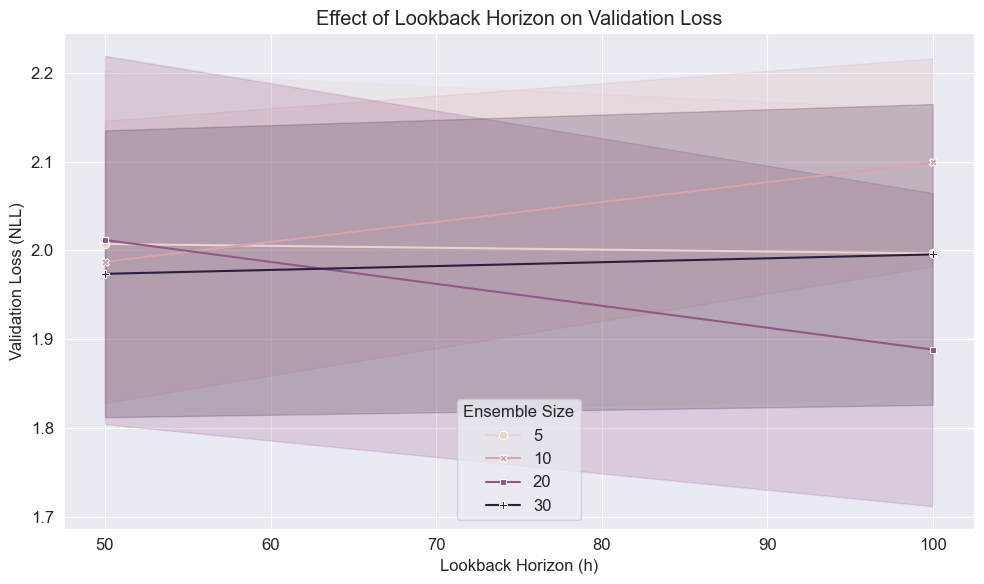

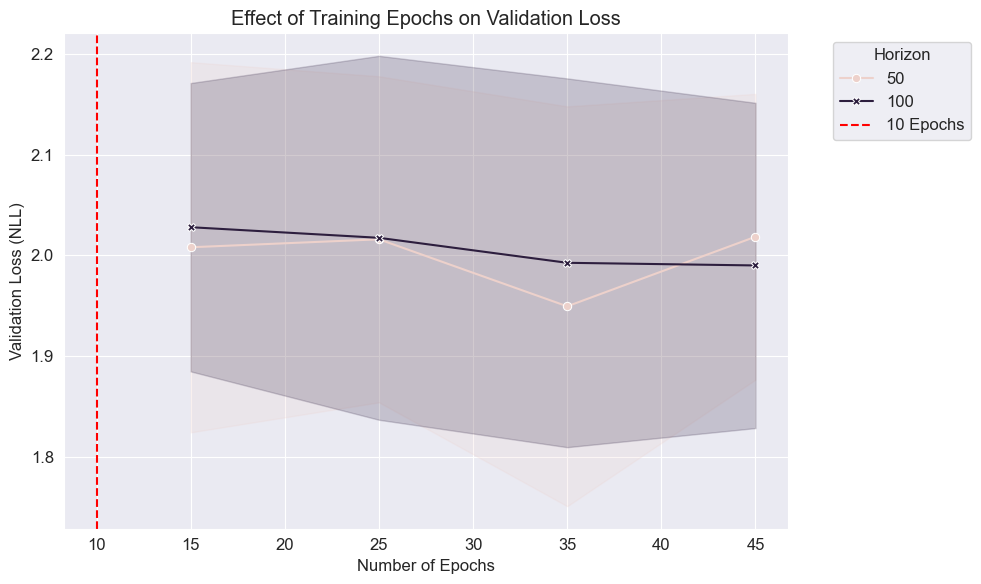

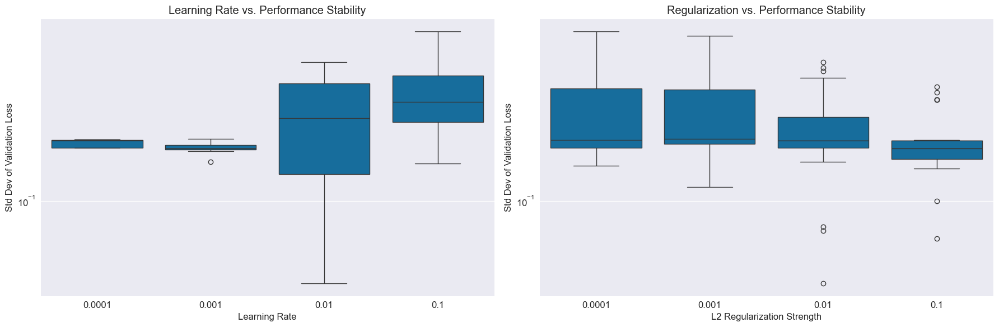

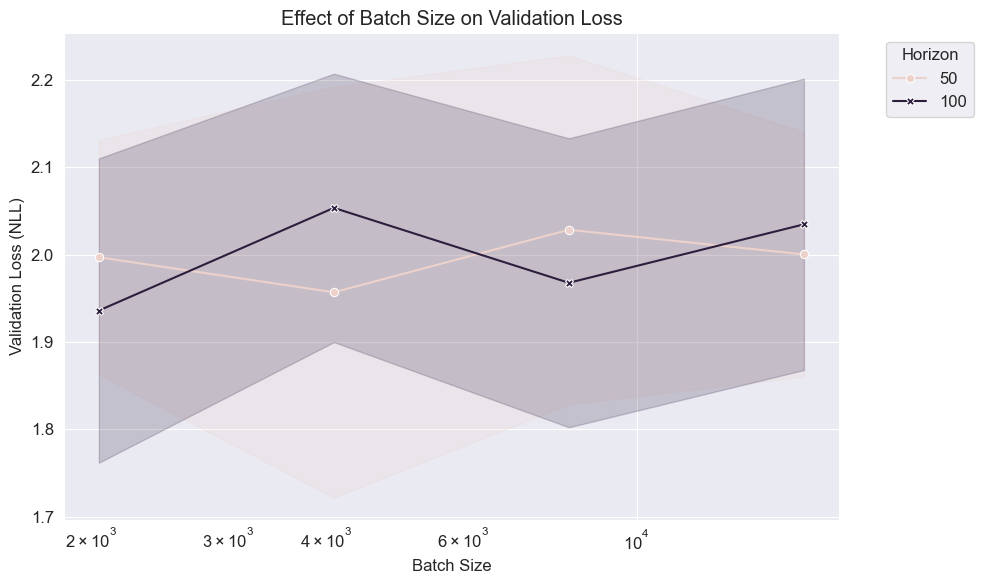

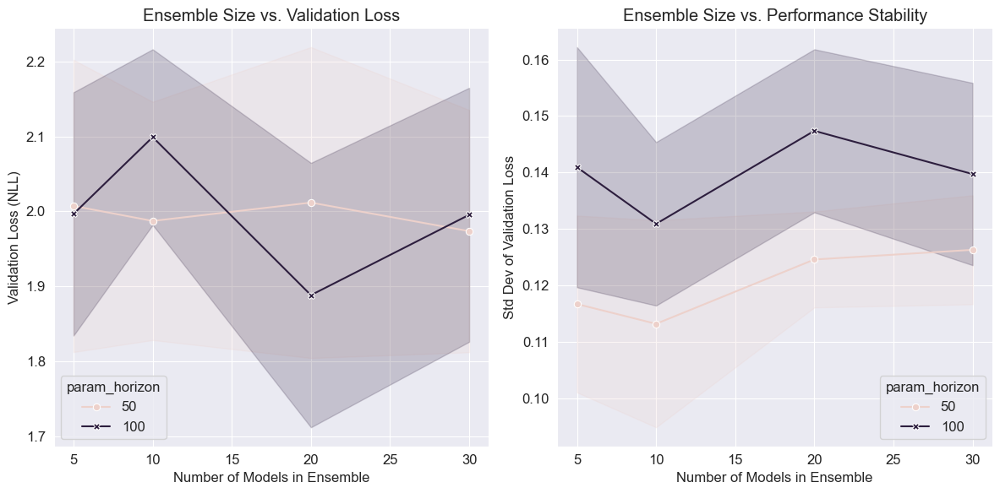


Report generated and visualizations saved!

Best configuration saved: Avg Loss = 1.6519


In [16]:
# Generate comprehensive report with expanded DataFrame
expanded_df = generate_full_report(results_df)

# Save best configuration
best_config_idx = expanded_df['avg_val_loss'].idxmin()
best_config = expanded_df.iloc[best_config_idx]['params']

with open("best_config.json", 'w') as f:
    json.dump(best_config, f, indent=2)

print(f"\nBest configuration saved: Avg Loss = {expanded_df.iloc[best_config_idx]['avg_val_loss']:.4f}")

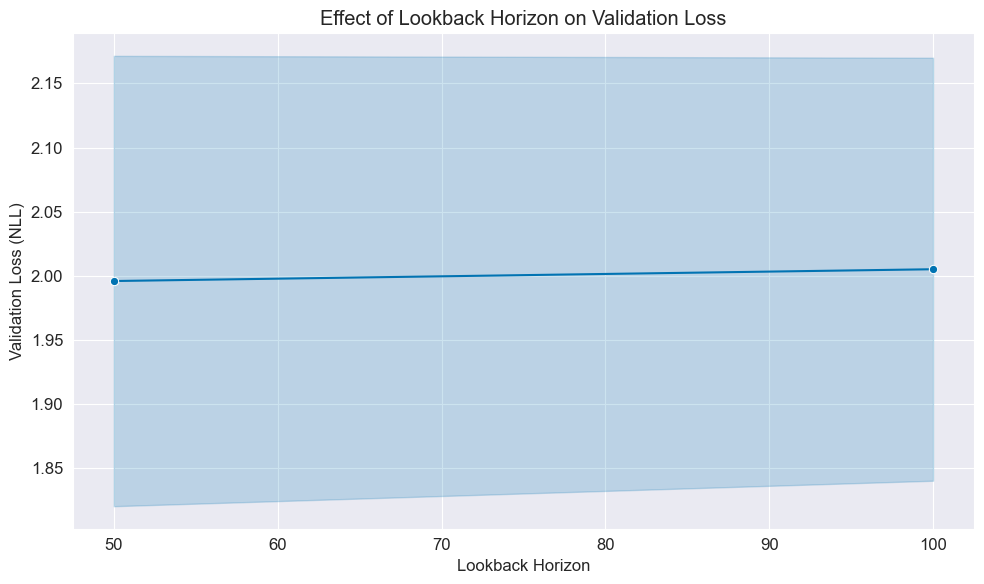

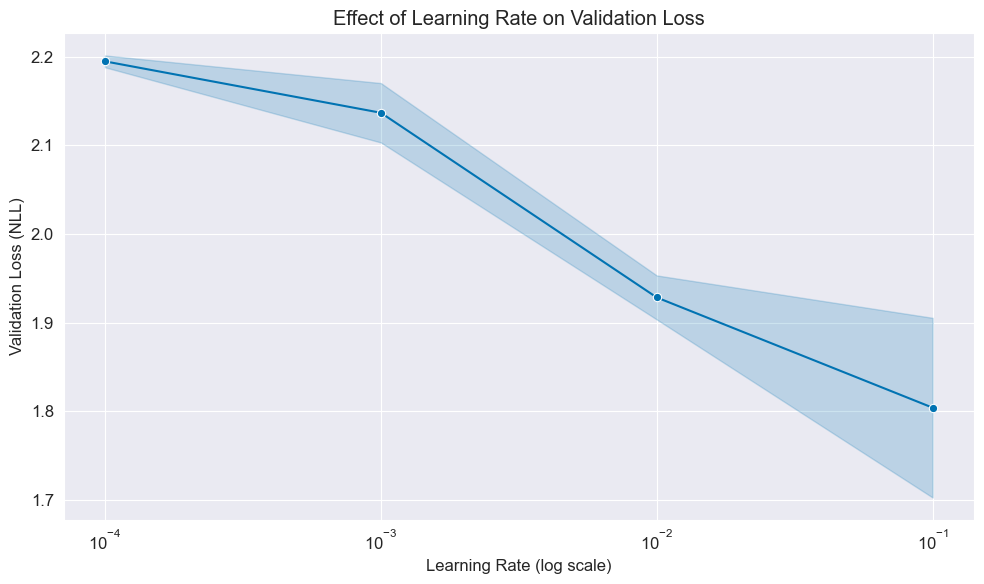

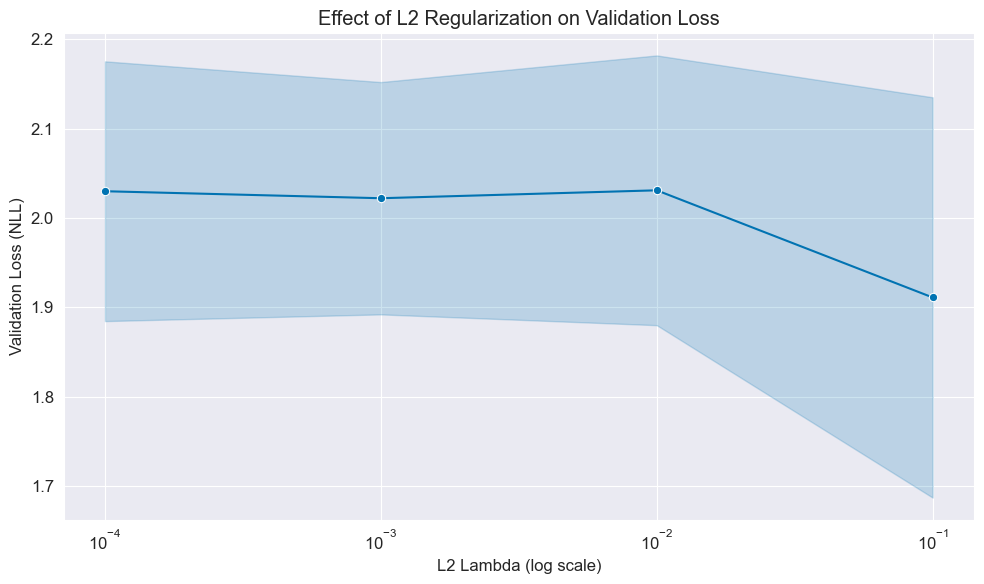

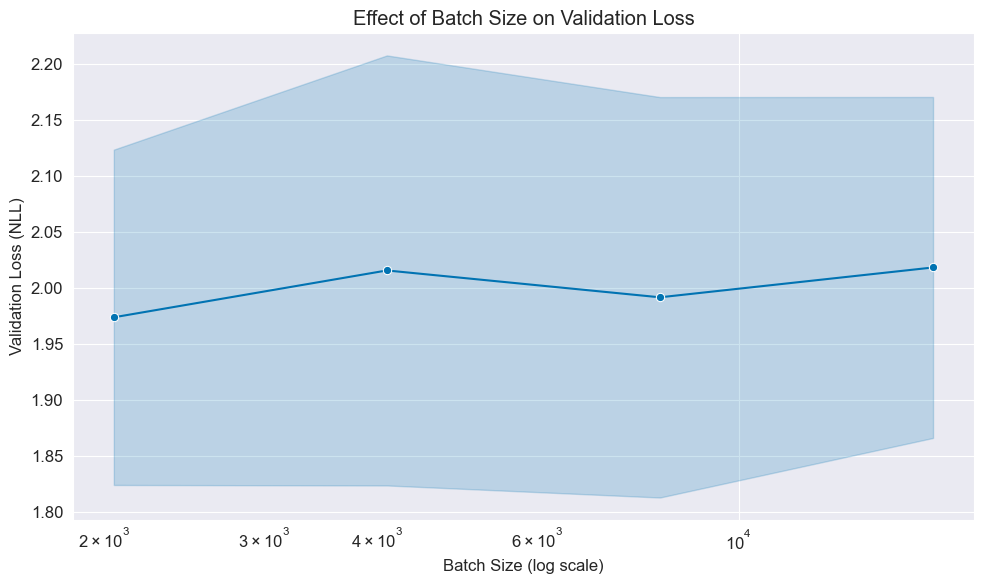

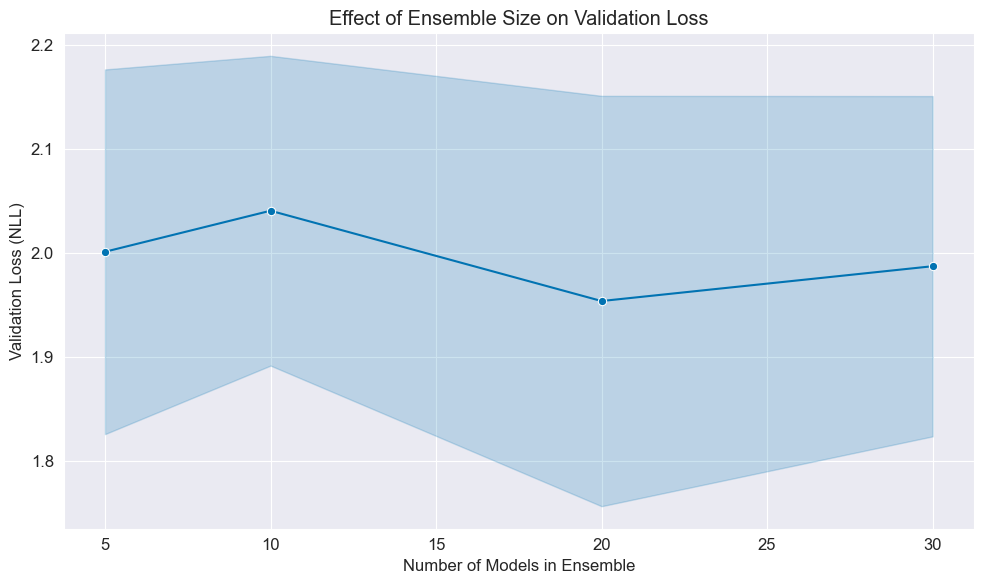

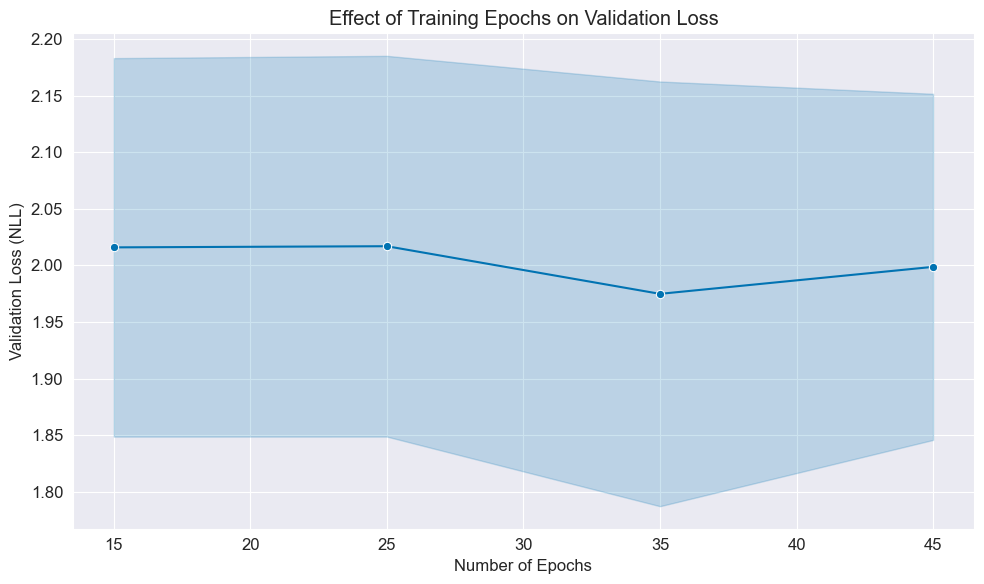

In [17]:
plot_individual_parameter_effects(expanded_df)